## Import required libraries

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision.utils import save_image, make_grid
from torchvision import datasets
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
from torch.utils.tensorboard import SummaryWriter
from sklearn.metrics import confusion_matrix, accuracy_score, mutual_info_score
from sklearn.feature_selection import mutual_info_regression
from sklearn.manifold import TSNE
import pandas as pd
from scipy.stats import pearsonr
import time
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import entropy
from IPython.display import display, HTML

## Connect to Drive and Configure Directories for output

In [ ]:
# Mount Google Drive to save results
drive.mount('/content/drive')

# Create base directories
os.makedirs("images", exist_ok=True)
os.makedirs("logs", exist_ok=True)
os.makedirs("checkpoints", exist_ok=True)

# Dictionary to store all final results for comparison
all_model_results = {}

Mounted at /content/drive


## Performance Metric Configuration

In [ ]:
# Performance Configuration
FAST_MODE = True  # Set to True for faster training, False for comprehensive evaluation
EVAL_SAMPLES = 1000 if FAST_MODE else 2000  # Number of samples for evaluation
TSNE_SAMPLES = 1000 if FAST_MODE else 2000  # Number of samples for t-SNE visualization
TB_IMG_INTERVAL = 5  # Log images to TensorBoard every N epochs
LOG_EPOCHS = [0, 4, 9]  # For 10 epochs training
ENABLE_TSNE = not FAST_MODE  # t-SNE is very slow, disable in fast mode

## Hyperparameters

In [ ]:
# Global hyperparameters
N_EPOCHS = 30
BATCH_SIZE = 64
LR = 0.0002
B1 = 0.5
B2 = 0.999
LATENT_DIM = 62
CODE_DIM = 2
N_CLASSES = 10
IMG_SIZE = 32
CHANNELS = 1
SAMPLE_INTERVAL = 400
SAVE_INTERVAL = 5

# Regularization hyperparameters
ORTHOGONAL_WEIGHT_REG = 0.1  # Weight for orthogonal regularization
CR_WEIGHT = 0.2  # Weight for contrastive regularization
CR_UPDATE_FREQ = 10  # Only compute CR loss every N batches

## Device Agnostic Configuration

In [ ]:
# Device configuration
cuda = torch.cuda.is_available()
device = torch.device("cuda" if cuda else "cpu")
print(f"Using device: {device}")

Using device: cuda


## Function for Orthogonal Regularization

In [ ]:
# Orthogonal Regularization Function
def orthogonal_regularization_loss(model, strength=1.0):
    """Compute orthogonal regularization loss on model weights"""
    loss = 0
    for name, param in model.named_parameters():
        if 'weight' in name and param.dim() > 1:
            # Matrix shape (out_features, in_features)
            matrix = param.view(param.size(0), -1)
            # Compute ||W^T W - I||_F, the deviation from orthogonality
            m = torch.matmul(matrix, matrix.t())
            identity = torch.eye(m.size(0), device=m.device)
            loss += torch.norm(m - identity, p='fro') * strength
    return loss

## Function for Contrastive Regularization

In [ ]:
# Contrastive Regularization Function
def contrastive_regularization_loss(generator, discriminator, batch_size):
    """Compute contrastive regularization loss"""
    # Reduce the number of samples to save computation
    pairs_per_batch = min(4, batch_size // 4)

    total_loss = 0

    try:
        # 1. First, test categorical code changes
        for _ in range(pairs_per_batch):
            # Generate base noise and latent codes
            z = torch.randn(1, LATENT_DIM).to(device)
            c_categorical = torch.zeros(1, N_CLASSES).to(device)
            category1 = np.random.randint(0, N_CLASSES)
            c_categorical[0, category1] = 1.0
            c_continuous = torch.zeros(1, CODE_DIM).to(device)

            # Generate first sample
            img1 = generator(z, c_categorical, c_continuous)
            _, pred_cat1, pred_cont1, features1 = discriminator(img1)

            # Change to a different category
            c_categorical_2 = torch.zeros(1, N_CLASSES).to(device)
            category2 = (category1 + np.random.randint(1, N_CLASSES)) % N_CLASSES  # Ensure different category
            c_categorical_2[0, category2] = 1.0

            # Generate second sample
            img2 = generator(z, c_categorical_2, c_continuous)
            _, pred_cat2, pred_cont2, features2 = discriminator(img2)

            # Categorical consistency: pred_cont should be the same despite category change
            cat_cont_consistency = F.mse_loss(pred_cont1, pred_cont2)

            # Feature difference should be primarily in category-relevant features
            feature_diff = features1 - features2
            feature_distance = torch.norm(feature_diff, p=2)

            # We want high feature distance but good consistency in continuous codes
            cat_loss = cat_cont_consistency - 0.1 * feature_distance
            total_loss += cat_loss

        # 2. Test continuous code changes (reduced to code_dim for computational efficiency)
        for dim in range(CODE_DIM):
            # Generate base noise and latent codes
            z = torch.randn(1, LATENT_DIM).to(device)
            c_categorical = torch.zeros(1, N_CLASSES).to(device)
            category = np.random.randint(0, N_CLASSES)
            c_categorical[0, category] = 1.0

            # Base continuous code
            c_continuous = torch.zeros(1, CODE_DIM).to(device)
            c_continuous[0, dim] = -0.8  # Starting value for this dimension

            # Generate first sample
            img1 = generator(z, c_categorical, c_continuous)
            _, pred_cat1, pred_cont1, features1 = discriminator(img1)

            # Change only the current continuous dimension
            c_continuous_2 = c_continuous.clone()
            c_continuous_2[0, dim] = 0.8  # End value for this dimension

            # Generate second sample
            img2 = generator(z, c_categorical, c_continuous_2)
            _, pred_cat2, pred_cont2, features2 = discriminator(img2)

            # Category consistency: pred_cat should be the same despite continuous code change
            cont_cat_consistency = F.mse_loss(pred_cat1, pred_cat2)

            # Continuous consistency for other dimensions: other dimensions should remain unchanged
            other_dims = [i for i in range(CODE_DIM) if i != dim]
            if other_dims:
                cont_cont_consistency = F.mse_loss(
                    pred_cont1[:, other_dims],
                    pred_cont2[:, other_dims]
                )
            else:
                cont_cont_consistency = torch.tensor(0.0).to(device)

            # Feature difference for this specific change
            feature_diff = features1 - features2
            feature_distance = torch.norm(feature_diff, p=2)

            # We want good category and other-dimension consistency, with appropriate feature changes
            cont_loss = cont_cat_consistency + cont_cont_consistency - 0.1 * feature_distance
            total_loss += cont_loss

        # Normalize by number of tests
        total_tests = pairs_per_batch + CODE_DIM
        avg_loss = total_loss / max(1, total_tests)

        return avg_loss

    except Exception as e:
        print(f"Warning: Error in CR loss calculation: {e}")
        return torch.tensor(0.0).to(device)

## Initialization of Weights

In [ ]:
# Function for Weights initialization
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0.0)

## Function for one-hot encoding

In [ ]:
# One-hot encoding
def to_categorical(y, num_columns):
    """Returns one-hot encoded Variable"""
    y_cat = np.zeros((y.shape[0], num_columns))
    y_cat[range(y.shape[0]), y] = 1.0
    return torch.FloatTensor(y_cat).to(device)

## Generator Class

In [ ]:
# Generator Network
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        input_dim = LATENT_DIM + N_CLASSES + CODE_DIM

        self.init_size = IMG_SIZE // 4  # Initial size before upsampling
        self.l1 = nn.Sequential(nn.Linear(input_dim, 128 * self.init_size ** 2))

        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, CHANNELS, 3, stride=1, padding=1),
            nn.Tanh(),
        )

    def forward(self, noise, labels, code):
        gen_input = torch.cat((noise, labels, code), -1)
        out = self.l1(gen_input)
        out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img

## Discriminator Class

In [ ]:
# Discriminator Network
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, bn=True):
            """Returns layers of each discriminator block"""
            block = [nn.Conv2d(in_filters, out_filters, 3, 2, 1), nn.LeakyReLU(0.2, inplace=True), nn.Dropout2d(0.25)]
            if bn:
                block.append(nn.BatchNorm2d(out_filters, 0.8))
            return block

        self.conv_blocks = nn.Sequential(
            *discriminator_block(CHANNELS, 16, bn=False),
            *discriminator_block(16, 32),
            *discriminator_block(32, 64),
            *discriminator_block(64, 128),
        )

        # The height and width of downsampled image
        ds_size = IMG_SIZE // 2 ** 4

        # Flattened feature dimension
        self.flattened_size = 128 * ds_size ** 2

        # Output layers
        self.adv_layer = nn.Sequential(nn.Linear(self.flattened_size, 1))
        self.aux_layer = nn.Sequential(nn.Linear(self.flattened_size, N_CLASSES), nn.Softmax(dim=1))
        self.latent_layer = nn.Sequential(nn.Linear(self.flattened_size, CODE_DIM))

    def forward(self, img):
        out = self.conv_blocks(img)
        features = out.view(out.shape[0], -1)  # Flattened features
        validity = self.adv_layer(features)
        label = self.aux_layer(features)
        latent_code = self.latent_layer(features)

        return validity, label, latent_code, features

## Function to save sample images

In [ ]:
# Function to save sample images
def sample_image(generator, n_row, batches_done, model_name, save_to_disk=True, show_plot=True):
    """Saves and visualizes a grid of generated digits varying latent codes"""
    output_dir = f"images/{model_name}"
    os.makedirs(f"{output_dir}/static", exist_ok=True)
    os.makedirs(f"{output_dir}/varying_c1", exist_ok=True)
    os.makedirs(f"{output_dir}/varying_c2", exist_ok=True)

    generator.eval()
    with torch.no_grad():
        # Static sample (fixed noise, varying categories)
        z = torch.randn(n_row ** 2, LATENT_DIM).to(device)
        static_sample = generator(z, static_label, static_code)
        grid_img = make_grid(static_sample.data, nrow=n_row, normalize=True)

        if save_to_disk:
            save_image(static_sample.data, f"{output_dir}/static/{batches_done}.png", nrow=n_row, normalize=True)

        # Vary continuous code c1 (horizontally) and categorical code (vertically)
        zeros = np.zeros((n_row ** 2, 1))
        c_varied = np.repeat(np.linspace(-1, 1, n_row)[:, np.newaxis], n_row, 0)
        c1 = torch.FloatTensor(np.concatenate((c_varied, zeros), -1)).to(device)
        c2 = torch.FloatTensor(np.concatenate((zeros, c_varied), -1)).to(device)

        sample1 = generator(static_z, static_label, c1)
        grid_img1 = make_grid(sample1.data, nrow=n_row, normalize=True)

        if save_to_disk:
            save_image(sample1.data, f"{output_dir}/varying_c1/{batches_done}.png", nrow=n_row, normalize=True)

        sample2 = generator(static_z, static_label, c2)
        grid_img2 = make_grid(sample2.data, nrow=n_row, normalize=True)

        if save_to_disk:
            save_image(sample2.data, f"{output_dir}/varying_c2/{batches_done}.png", nrow=n_row, normalize=True)

        # Display images in notebook (only if requested)
        if show_plot:
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            axes[0].imshow(grid_img.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)
            axes[0].set_title(f"{model_name} - Static Sample")
            axes[0].axis('off')

            axes[1].imshow(grid_img1.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)
            axes[1].set_title(f"{model_name} - Varying C1")
            axes[1].axis('off')

            axes[2].imshow(grid_img2.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)
            axes[2].set_title(f"{model_name} - Varying C2")
            axes[2].axis('off')

            plt.tight_layout()
            plt.show()

    generator.train()
    return static_sample, sample1, sample2

## Function to evaluate Categorical Accuracy

In [ ]:
# Quick evaluation of categorical accuracy
def quick_evaluate_categorical_accuracy(generator, discriminator):
    """Quick evaluation of categorical accuracy without visualizations"""
    generator.eval()
    discriminator.eval()

    n_samples = EVAL_SAMPLES // 2  # Use fewer samples for faster evaluation
    batch_size = 100
    all_pred_labels = []
    all_true_labels = []

    with torch.no_grad():
        for i in range(0, n_samples, batch_size):
            curr_batch_size = min(batch_size, n_samples - i)

            # Generate random latent codes
            z = torch.randn(curr_batch_size, LATENT_DIM).to(device)

            # Generate random categorical labels
            true_labels = np.random.randint(0, N_CLASSES, curr_batch_size)
            label_input = to_categorical(true_labels, num_columns=N_CLASSES)

            # Generate random continuous codes
            cont_code = torch.FloatTensor(np.random.uniform(-1, 1, (curr_batch_size, CODE_DIM))).to(device)

            # Generate images
            gen_imgs = generator(z, label_input, cont_code)

            # Get Q network predictions
            _, pred_label, _, _ = discriminator(gen_imgs)

            # Convert predictions to class indices
            pred_classes = torch.argmax(pred_label, dim=1).cpu().numpy()

            all_pred_labels.append(pred_classes)
            all_true_labels.append(true_labels)

    # Concatenate all predictions and truths
    all_pred_labels = np.concatenate(all_pred_labels)
    all_true_labels = np.concatenate(all_true_labels)

    # Calculate accuracy
    cat_accuracy = accuracy_score(all_true_labels, all_pred_labels)

    generator.train()
    discriminator.train()

    return cat_accuracy

## Function to evaluate Continuous Code Correlation

In [ ]:
# Quick evaluation of continuous code correlation
def quick_evaluate_continuous_correlation(generator, discriminator):
    """Quick evaluation of continuous code correlation without visualizations"""
    generator.eval()
    discriminator.eval()

    n_samples = EVAL_SAMPLES // 2  # Use fewer samples for faster evaluation
    batch_size = 100
    c1_corr, c2_corr = [], []

    with torch.no_grad():
        for i in range(0, n_samples, batch_size):
            curr_batch_size = min(batch_size, n_samples - i)

            # Generate random latent codes
            z = torch.randn(curr_batch_size, LATENT_DIM).to(device)

            # Generate random categorical labels
            true_labels = np.random.randint(0, N_CLASSES, curr_batch_size)
            label_input = to_categorical(true_labels, num_columns=N_CLASSES)

            # Generate random continuous codes
            cont_code = torch.FloatTensor(np.random.uniform(-1, 1, (curr_batch_size, CODE_DIM))).to(device)

            # Generate images
            gen_imgs = generator(z, label_input, cont_code)

            # Get Q network predictions
            _, _, pred_cont_code, _ = discriminator(gen_imgs)

            # Calculate correlation for each continuous code
            for j in range(CODE_DIM):
                true_c = cont_code[:, j].cpu().numpy()
                pred_c = pred_cont_code[:, j].cpu().numpy()

                corr, _ = pearsonr(true_c, pred_c)

                if j == 0:
                    c1_corr.append(corr)
                else:
                    c2_corr.append(corr)

    # Calculate average correlation
    avg_c1_corr = np.mean(c1_corr)
    avg_c2_corr = np.mean(c2_corr)
    avg_corr = (avg_c1_corr + avg_c2_corr) / 2

    generator.train()
    discriminator.train()

    return avg_c1_corr, avg_c2_corr, avg_corr

## Functions to Compute various Disentaglement Metrics

### Function to Compute Factor Independence

In [ ]:
# Advanced Disentanglement Metrics
def compute_factor_independence(generator, discriminator, n_samples=500):
    """
    Measure independence between latent factors by analyzing cross-correlations
    Lower score is better (less cross-talk between factors)
    """
    generator.eval()
    discriminator.eval()

    # Create combinations of factors to test
    factor_pairs = []
    # Add categorical-categorical pairs
    for i in range(N_CLASSES):
        for j in range(i+1, N_CLASSES):
            factor_pairs.append(('cat', i, 'cat', j))

    # Add categorical-continuous pairs
    for i in range(N_CLASSES):
        for j in range(CODE_DIM):
            factor_pairs.append(('cat', i, 'cont', j))

    # Add continuous-continuous pairs
    for i in range(CODE_DIM):
        for j in range(i+1, CODE_DIM):
            factor_pairs.append(('cont', i, 'cont', j))

    # Test a smaller subset of pairs to save computation time
    if FAST_MODE and len(factor_pairs) > 20:
        np.random.shuffle(factor_pairs)
        factor_pairs = factor_pairs[:20]

    # Test each factor pair for independence
    independence_scores = []

    with torch.no_grad():
        for factor1_type, factor1_idx, factor2_type, factor2_idx in factor_pairs:
            # Generate random inputs
            z = torch.randn(n_samples, LATENT_DIM).to(device)

            # Initialize random categorical and continuous codes
            categorical = torch.zeros(n_samples, N_CLASSES).to(device)
            continuous = torch.zeros(n_samples, CODE_DIM).to(device)

            # Vary the first factor
            if factor1_type == 'cat':
                categorical[:, factor1_idx] = 1.0  # One-hot encoding for the specific category
            else:  # 'cont'
                continuous[:, factor1_idx] = torch.linspace(-1, 1, n_samples).to(device)

            # Generate first set of images
            gen_imgs1 = generator(z, categorical, continuous)

            # Extract features
            _, pred_labels1, pred_cont1, features1 = discriminator(gen_imgs1)

            # Now vary the second factor
            categorical = torch.zeros(n_samples, N_CLASSES).to(device)
            continuous = torch.zeros(n_samples, CODE_DIM).to(device)

            if factor2_type == 'cat':
                categorical[:, factor2_idx] = 1.0
            else:  # 'cont'
                continuous[:, factor2_idx] = torch.linspace(-1, 1, n_samples).to(device)

            # Generate second set of images
            gen_imgs2 = generator(z, categorical, continuous)

            # Extract features
            _, pred_labels2, pred_cont2, features2 = discriminator(gen_imgs2)

            # Calculate feature-wise correlation
            features1_np = features1.cpu().numpy()
            features2_np = features2.cpu().numpy()

            # Compute average absolute correlation between feature spaces
            correlations = np.zeros(features1_np.shape[1])

            for i in range(features1_np.shape[1]):
                corr, _ = pearsonr(features1_np[:, i], features2_np[:, i])
                correlations[i] = abs(corr)

            # Average independence score for this factor pair
            independence_scores.append(np.mean(correlations))

    generator.train()
    discriminator.train()

    # Overall independence score (lower is better)
    avg_independence = np.mean(independence_scores)

    return avg_independence

### Function to Compute Latent Traversal Linearity

In [ ]:
def compute_latent_traversal_linearity(generator, n_steps=20):
    """Measure how linear the changes are when traversing the latent space"""
    generator.eval()
    linearity_scores = []

    with torch.no_grad():
        # Fixed noise
        z = torch.randn(1, LATENT_DIM).to(device)

        # Test continuous dimensions
        for dim in range(CODE_DIM):
            # Create latent traversals
            categorical = torch.zeros(n_steps, N_CLASSES).to(device)
            categorical[:, 0] = 1.0  # Use first category for all samples

            continuous = torch.zeros(n_steps, CODE_DIM).to(device)
            continuous[:, dim] = torch.linspace(-1, 1, n_steps).to(device)

            # Generate images
            gen_imgs = generator(z.repeat(n_steps, 1), categorical, continuous)

            # Convert to numpy for analysis
            imgs_np = gen_imgs.cpu().numpy().reshape(n_steps, -1)

            # Calculate pairwise distances between adjacent images
            distances = []
            for i in range(1, n_steps):
                dist = np.linalg.norm(imgs_np[i] - imgs_np[i-1])
                distances.append(dist)

            # Linearity = consistency of distances
            if len(distances) > 0:
                std_dist = np.std(distances)
                mean_dist = np.mean(distances)
                if mean_dist > 0:
                    linearity_score = 1.0 - min(1.0, std_dist / mean_dist)
                    linearity_scores.append(linearity_score)

        # Test categorical dimensions
        for cat in range(N_CLASSES):
            # Create one-hot encodings for each category
            categorical = torch.zeros(N_CLASSES, N_CLASSES).to(device)
            for i in range(N_CLASSES):
                categorical[i, i] = 1.0

            continuous = torch.zeros(N_CLASSES, CODE_DIM).to(device)

            # Generate images
            gen_imgs = generator(z.repeat(N_CLASSES, 1), categorical, continuous)

            # Convert to numpy for analysis
            imgs_np = gen_imgs.cpu().numpy().reshape(N_CLASSES, -1)

            # Calculate inter-category distances
            distances = []
            for i in range(1, N_CLASSES):
                dist = np.linalg.norm(imgs_np[i] - imgs_np[i-1])
                distances.append(dist)

            if len(distances) > 0:
                std_dist = np.std(distances)
                mean_dist = np.mean(distances)
                if mean_dist > 0:
                    linearity_score = 1.0 - min(1.0, std_dist / mean_dist)
                    linearity_scores.append(linearity_score)

    generator.train()

    # Overall linearity score (higher is better)
    avg_linearity = np.mean(linearity_scores) if linearity_scores else 0.0

    return avg_linearity

### Function to Compute Mutual Information Score

In [ ]:
def compute_mutual_info_score(generator, discriminator, n_samples=1000):
    """Compute mutual information scores between latent codes and predictions"""
    generator.eval()
    discriminator.eval()
    results = {}

    with torch.no_grad():
        # 1. Test categorical code mutual information
        z = torch.randn(n_samples, LATENT_DIM).to(device)

        labels = np.random.randint(0, N_CLASSES, n_samples)
        categorical = to_categorical(labels, N_CLASSES)

        # Random continuous
        continuous = torch.FloatTensor(np.random.uniform(-1, 1, (n_samples, CODE_DIM))).to(device)

        # Generate images
        gen_imgs = generator(z, categorical, continuous)

        # Get predictions
        _, pred_cat, pred_cont, _ = discriminator(gen_imgs)

        # Convert to numpy
        pred_cat_np = pred_cat.cpu().numpy()
        pred_cont_np = pred_cont.cpu().numpy()

        # For categorical, get predicted class
        pred_labels = np.argmax(pred_cat_np, axis=1)

        # Calculate mutual information for categorical
        cat_mi = mutual_info_score(labels, pred_labels)

        # Normalize by entropy of marginal
        cat_entropy = entropy(np.bincount(labels) / n_samples)
        if cat_entropy > 0:
            norm_cat_mi = cat_mi / cat_entropy
        else:
            norm_cat_mi = 0.0

        results['categorical_mi'] = norm_cat_mi

        # 2. Test continuous code mutual information
        continuous_mi = []

        for dim in range(CODE_DIM):
            # Create samples with random values for this dimension
            z = torch.randn(n_samples, LATENT_DIM).to(device)
            categorical = torch.zeros(n_samples, N_CLASSES).to(device)
            categorical[:, 0] = 1.0  # Use first category for all

            continuous = torch.zeros(n_samples, CODE_DIM).to(device)
            true_values = np.random.uniform(-1, 1, n_samples)
            continuous[:, dim] = torch.FloatTensor(true_values).to(device)

            # Generate images
            gen_imgs = generator(z, categorical, continuous)

            # Get predictions
            _, _, pred_cont, _ = discriminator(gen_imgs)

            # Calculate mutual information (use regression for continuous)
            pred_values = pred_cont[:, dim].cpu().numpy()

            # Scale values to [0,1] range for MI calculation
            scaler = MinMaxScaler()
            true_values_scaled = scaler.fit_transform(true_values.reshape(-1, 1)).flatten()
            pred_values_scaled = scaler.fit_transform(pred_values.reshape(-1, 1)).flatten()

            # Calculate MI
            cont_mi = mutual_info_regression(
                true_values_scaled.reshape(-1, 1),
                pred_values_scaled
            )[0]

            continuous_mi.append(cont_mi)

        results['continuous_mi_avg'] = np.mean(continuous_mi)
        for i, mi in enumerate(continuous_mi):
            results[f'continuous_mi_{i}'] = mi

    generator.train()
    discriminator.train()

    return results

### Function to Compute Disentaglement Metric

In [ ]:
def compute_disentanglement_metric(generator, discriminator, n_samples=1000):
    """Calculate disentanglement metrics"""
    generator.eval()
    discriminator.eval()

    # Number of factors we're analyzing
    n_factors = N_CLASSES + CODE_DIM

    # Matrix to store the factor importance
    importance_matrix = np.zeros((n_factors, n_factors))

    # Reduce number of samples in fast mode
    if FAST_MODE:
        n_samples = n_samples // 2

    with torch.no_grad():
        # 1. Test categorical factors (each class)
        for cat_idx in range(N_CLASSES):
            # Generate samples with this category
            z = torch.randn(n_samples, LATENT_DIM).to(device)
            categorical = torch.zeros(n_samples, N_CLASSES).to(device)
            categorical[:, cat_idx] = 1.0
            continuous = torch.zeros(n_samples, CODE_DIM).to(device)

            # Generate images
            gen_imgs_cat = generator(z, categorical, continuous)

            # Generate baseline - no specific category
            baseline_cat = torch.zeros(n_samples, N_CLASSES).to(device)
            # Distribute evenly across all categories except this one
            other_cats = list(range(N_CLASSES))
            other_cats.remove(cat_idx)
            for i in range(n_samples):
                rand_cat = np.random.choice(other_cats)
                baseline_cat[i, rand_cat] = 1.0

            gen_imgs_baseline = generator(z, baseline_cat, continuous)

            # Measure how much this changes the generated image
            difference = torch.mean(torch.abs(gen_imgs_cat - gen_imgs_baseline)).item()
            importance_matrix[cat_idx, cat_idx] = difference

            # Test how it affects other categories (should be minimal)
            for test_idx in range(N_CLASSES):
                if test_idx == cat_idx:
                    continue

                # Get predicted categories for both sets
                _, pred_cat, _, _ = discriminator(gen_imgs_cat)
                _, pred_baseline, _, _ = discriminator(gen_imgs_baseline)

                # How much did the probability of other categories change?
                diff = torch.mean(torch.abs(pred_cat[:, test_idx] - pred_baseline[:, test_idx])).item()
                importance_matrix[cat_idx, test_idx] = diff

        # 2. Test continuous factors
        for cont_idx in range(CODE_DIM):
            # Generate samples with this continuous dimension varied
            z = torch.randn(n_samples, LATENT_DIM).to(device)
            categorical = torch.zeros(n_samples, N_CLASSES).to(device)
            categorical[:, 0] = 1.0  # Use first category for all

            continuous = torch.zeros(n_samples, CODE_DIM).to(device)
            continuous[:, cont_idx] = torch.linspace(-1, 1, n_samples).to(device)

            gen_imgs_cont = generator(z, categorical, continuous)

            # Generate baseline - no variation
            continuous_baseline = torch.zeros(n_samples, CODE_DIM).to(device)
            gen_imgs_baseline = generator(z, categorical, continuous_baseline)

            # Measure how much this changes the generated image
            difference = torch.mean(torch.abs(gen_imgs_cont - gen_imgs_baseline)).item()
            importance_matrix[N_CLASSES + cont_idx, N_CLASSES + cont_idx] = difference

            # Test how it affects continuous dimensions (should be minimal)
            for test_idx in range(CODE_DIM):
                if test_idx == cont_idx:
                    continue

                # Get predicted continuous codes for both sets - FIX HERE
                _, _, pred_cont, _ = discriminator(gen_imgs_cont)
                _, _, pred_baseline, _ = discriminator(gen_imgs_baseline)

                # How much did the other continuous dimension change?
                diff = torch.mean(torch.abs(pred_cont[:, test_idx] - pred_baseline[:, test_idx])).item()
                importance_matrix[N_CLASSES + cont_idx, N_CLASSES + test_idx] = diff

            # Test how it affects categorical dimensions (should be minimal)
            # FIX HERE
            _, pred_cat, _, _ = discriminator(gen_imgs_cont)
            _, pred_baseline, _, _ = discriminator(gen_imgs_baseline)

            for test_idx in range(N_CLASSES):
                diff = torch.mean(torch.abs(pred_cat[:, test_idx] - pred_baseline[:, test_idx])).item()
                importance_matrix[N_CLASSES + cont_idx, test_idx] = diff

    # Normalize the matrix
    row_sums = importance_matrix.sum(axis=1, keepdims=True)
    normalized_matrix = importance_matrix / np.maximum(row_sums, 1e-10)

    # Calculate disentanglement score
    disentanglement_score = 0
    for i in range(n_factors):
        # Find the max importance for this factor
        max_importance = np.max(normalized_matrix[i, :])
        # Calculate entropy of the importance distribution
        distribution = normalized_matrix[i, :] / np.sum(normalized_matrix[i, :])
        factor_entropy = entropy(distribution + 1e-10)
        max_entropy = np.log(n_factors)
        # Normalized entropy (1 - H/H_max) gives disentanglement
        factor_disentanglement = 1.0 - (factor_entropy / max_entropy)
        disentanglement_score += factor_disentanglement

    # Normalize by number of factors
    disentanglement_score /= n_factors

    generator.train()
    discriminator.train()

    return disentanglement_score, normalized_matrix

## Function to Evaluate Model Disentaglement Metrics

In [ ]:
# Model evaluation function
def evaluate_model(generator, discriminator, model_name, stage="initial", save_to_disk=True):
    """Evaluate the model's disentanglement metrics"""
    # Create a numeric identifier for TensorBoard
    if stage == "initial":
        tb_step = 0
    elif stage == "final":
        tb_step = N_EPOCHS
    else:
        try:
            tb_step = int(stage.split('_')[-1])
        except:
            tb_step = -1

    print(f"\n{'='*20} {model_name} - {stage.capitalize()} Model Evaluation {'='*20}")
    results = {}

    # If in fast mode and it's initial evaluation, do a lightweight evaluation
    if FAST_MODE and stage == "initial":
        # Just generate sample images
        print("Fast mode: Generating initial sample images...")
        sample_image(generator, n_row=10, batches_done=f"{stage}_evaluation",
                    model_name=model_name, save_to_disk=save_to_disk)

        # Get quick metrics
        print("Fast mode: Getting initial metrics...")
        cat_accuracy = quick_evaluate_categorical_accuracy(generator, discriminator)
        avg_c1_corr, avg_c2_corr, avg_corr = quick_evaluate_continuous_correlation(generator, discriminator)

        results = {
            'model': model_name,
            'categorical_accuracy': cat_accuracy,
            'continuous_correlation_c1': avg_c1_corr,
            'continuous_correlation_c2': avg_c2_corr,
            'continuous_correlation_avg': avg_corr
        }

        # Calculate basic disentanglement metric (quick version)
        print("Fast mode: Calculating initial disentanglement metrics...")
        factor_independence = compute_factor_independence(generator, discriminator, n_samples=200)
        results['factor_independence'] = factor_independence

        print("\nInitial Metrics Summary:")
        for metric, value in results.items():
            if metric != 'model':
                print(f"{metric}: {value:.4f}")

        # Create a dummy disentanglement matrix for consistency in return values
        dummy_matrix = np.zeros((N_CLASSES + CODE_DIM, N_CLASSES + CODE_DIM))

        return results, dummy_matrix

    generator.eval()
    discriminator.eval()

    # 1. Generate sample images
    print("Generating sample images...")
    sample_image(generator, n_row=10, batches_done=f"{stage}_evaluation",
                model_name=model_name, save_to_disk=save_to_disk, show_plot=True)

    # 2. Basic Metrics - Categorical Accuracy & Continuous Correlation
    print("Evaluating basic metrics...")
    cat_accuracy = quick_evaluate_categorical_accuracy(generator, discriminator)
    avg_c1_corr, avg_c2_corr, avg_corr = quick_evaluate_continuous_correlation(generator, discriminator)

    results = {
        'model': model_name,
        'categorical_accuracy': cat_accuracy,
        'continuous_correlation_c1': avg_c1_corr,
        'continuous_correlation_c2': avg_c2_corr,
        'continuous_correlation_avg': avg_corr
    }

    # 3. Advanced Disentanglement Metrics
    print("Calculating advanced disentanglement metrics...")

    # 3.1. Factor Independence
    factor_independence = compute_factor_independence(generator, discriminator)
    results['factor_independence'] = factor_independence

    # 3.2. Latent Traversal Linearity
    traversal_linearity = compute_latent_traversal_linearity(generator)
    results['traversal_linearity'] = traversal_linearity

    # 3.3. Mutual Information Score
    mi_results = compute_mutual_info_score(generator, discriminator)
    results.update(mi_results)

    # 3.4. Disentanglement Metric
    disent_score, disent_matrix = compute_disentanglement_metric(generator, discriminator)
    results['disentanglement_score'] = disent_score

    # Display all metrics in a table
    print("\nMetrics Summary:")
    for metric, value in results.items():
        if metric != 'model':
            print(f"{metric}: {value:.4f}")

    generator.train()
    discriminator.train()

    return results, disent_matrix

## Function to Train Any Model (Naive/OR/CR/ORCR) and Create Visualizations

In [ ]:
# Function to train a specific model
def train_model(model_name, use_orthogonal_reg=False, use_contrastive_reg=False):
    print(f"\n{'='*40}")
    print(f"Starting training for {model_name}")
    print(f"{'='*40}")
    print(f"Orthogonal Regularization: {'Enabled' if use_orthogonal_reg else 'Disabled'}")
    print(f"Contrastive Regularization: {'Enabled' if use_contrastive_reg else 'Disabled'}")

    # Create model-specific directories
    os.makedirs(f"images/{model_name}", exist_ok=True)
    os.makedirs(f"checkpoints/{model_name}", exist_ok=True)
    os.makedirs(f"logs/{model_name}", exist_ok=True)

    # Create TensorBoard writer for this model
    writer = SummaryWriter(log_dir=f"logs/{model_name}")

    # Initialize models
    generator = Generator().to(device)
    discriminator = Discriminator().to(device)

    # Initialize weights
    generator.apply(weights_init_normal)
    discriminator.apply(weights_init_normal)

    # Loss functions
    adversarial_loss = nn.MSELoss()
    categorical_loss = nn.CrossEntropyLoss()
    continuous_loss = nn.MSELoss()

    # Loss weights
    lambda_cat = 1
    lambda_con = 0.1
    lambda_ortho = ORTHOGONAL_WEIGHT_REG if use_orthogonal_reg else 0
    lambda_cr = CR_WEIGHT if use_contrastive_reg else 0

    # Optimizers
    optimizer_G = torch.optim.Adam(generator.parameters(), lr=LR, betas=(B1, B2))
    optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=LR, betas=(B1, B2))
    optimizer_info = torch.optim.Adam(
        list(generator.parameters()) + list(discriminator.parameters()),
        lr=LR,
        betas=(B1, B2)
    )

    # Initial evaluation
    initial_results, _ = evaluate_model(generator, discriminator, model_name, stage="initial")

    # Training loop
    start_time = time.time()
    g_losses = []
    d_losses = []
    info_losses = []
    ortho_losses = []
    cr_losses = []
    disentanglement_scores = []
    epoch_accuracies = []
    epoch_correlations = []

    print("\nStarting training...")
    for epoch in range(N_EPOCHS):
        epoch_start_time = time.time()
        epoch_g_losses = []
        epoch_d_losses = []
        epoch_info_losses = []
        epoch_ortho_losses = []
        epoch_cr_losses = []

        # Use progress bar with less frequent updates for speed
        pbar = tqdm(enumerate(dataloader), total=len(dataloader), desc=f"Epoch {epoch+1}/{N_EPOCHS}")
        for i, (imgs, labels) in pbar:
            batch_size = imgs.shape[0]

            # Adversarial ground truths
            valid = torch.ones(batch_size, 1).to(device)
            fake = torch.zeros(batch_size, 1).to(device)

            # Configure input
            real_imgs = imgs.to(device)
            labels_onehot = to_categorical(labels.numpy(), num_columns=N_CLASSES)

            # -----------------
            #  Train Generator
            # -----------------
            optimizer_G.zero_grad()

            # Sample noise and latent codes
            z = torch.randn(batch_size, LATENT_DIM).to(device)
            label_input = to_categorical(np.random.randint(0, N_CLASSES, batch_size), num_columns=N_CLASSES)
            code_input = torch.FloatTensor(np.random.uniform(-1, 1, (batch_size, CODE_DIM))).to(device)

            # Generate images
            gen_imgs = generator(z, label_input, code_input)

            # Loss measures generator's ability to fool the discriminator
            validity, _, _, _ = discriminator(gen_imgs)
            g_loss = adversarial_loss(validity, valid)

            # Add regularizations if enabled
            ortho_loss_g = torch.tensor(0.0).to(device)
            cr_loss_g = torch.tensor(0.0).to(device)

            if use_orthogonal_reg:
                ortho_loss_g = orthogonal_regularization_loss(generator, lambda_ortho)

            if use_contrastive_reg and i % CR_UPDATE_FREQ == 0:
                try:
                    cr_loss_g = contrastive_regularization_loss(generator, discriminator, batch_size) * lambda_cr
                except Exception as e:
                    print(f"Warning: Error in CR loss calculation: {e}")

            # Combined loss
            total_g_loss = g_loss + ortho_loss_g + cr_loss_g

            total_g_loss.backward()
            optimizer_G.step()

            # ---------------------
            #  Train Discriminator
            # ---------------------
            optimizer_D.zero_grad()

            # Loss for real images
            real_pred, _, _, _ = discriminator(real_imgs)
            d_real_loss = adversarial_loss(real_pred, valid)

            # Loss for fake images
            fake_pred, _, _, _ = discriminator(gen_imgs.detach())
            d_fake_loss = adversarial_loss(fake_pred, fake)

            # Total discriminator loss
            d_loss = (d_real_loss + d_fake_loss) / 2

            # Add orthogonal regularization if enabled
            ortho_loss_d = torch.tensor(0.0).to(device)
            if use_orthogonal_reg:
                ortho_loss_d = orthogonal_regularization_loss(discriminator, lambda_ortho)
                d_loss += ortho_loss_d

            d_loss.backward()
            optimizer_D.step()

            # ------------------
            # Information Loss
            # ------------------
            optimizer_info.zero_grad()

            # Sample latent codes and noise
            sampled_labels = np.random.randint(0, N_CLASSES, batch_size)
            gt_labels = torch.LongTensor(sampled_labels).to(device)

            z = torch.randn(batch_size, LATENT_DIM).to(device)
            label_input = to_categorical(sampled_labels, num_columns=N_CLASSES)
            code_input = torch.FloatTensor(np.random.uniform(-1, 1, (batch_size, CODE_DIM))).to(device)

            # Generate images and get predictions
            gen_imgs = generator(z, label_input, code_input)
            _, pred_label, pred_code, _ = discriminator(gen_imgs)

            # Calculate information loss
            info_loss = lambda_cat * categorical_loss(pred_label, gt_labels) + lambda_con * continuous_loss(pred_code, code_input)

            # Add regularizations for info loss if enabled
            ortho_loss_info = torch.tensor(0.0).to(device)
            cr_loss_info = torch.tensor(0.0).to(device)

            if use_orthogonal_reg:
                ortho_loss_info = orthogonal_regularization_loss(generator, lambda_ortho/2) + orthogonal_regularization_loss(discriminator, lambda_ortho/2)

            if use_contrastive_reg and i % CR_UPDATE_FREQ == 0:
                try:
                    cr_loss_info = contrastive_regularization_loss(generator, discriminator, batch_size) * lambda_cr / 2
                except Exception as e:
                    print(f"Warning: Error in CR loss calculation: {e}")

            # Combined loss
            total_info_loss = info_loss + ortho_loss_info + cr_loss_info

            total_info_loss.backward()
            optimizer_info.step()

            # Record batch losses
            epoch_g_losses.append(g_loss.item())
            epoch_d_losses.append(d_loss.item())
            epoch_info_losses.append(info_loss.item())
            if use_orthogonal_reg:
                epoch_ortho_losses.append((ortho_loss_g + ortho_loss_d + ortho_loss_info).item())
            if use_contrastive_reg:
                epoch_cr_losses.append((cr_loss_g + cr_loss_info).item())

            # Update progress bar with less frequency for better performance
            if i % 20 == 0:
                loss_dict = {
                    'D_loss': f"{d_loss.item():.4f}",
                    'G_loss': f"{g_loss.item():.4f}",
                    'Info_loss': f"{info_loss.item():.4f}"
                }
                if use_orthogonal_reg:
                    ortho_val = (ortho_loss_g + ortho_loss_d + ortho_loss_info).item()
                    loss_dict['Ortho_loss'] = f"{ortho_val:.4f}"
                if use_contrastive_reg:
                    cr_val = (cr_loss_g + cr_loss_info).item()
                    loss_dict['CR_loss'] = f"{cr_val:.4f}"

                pbar.set_postfix(loss_dict)

            # Generate sample images at intervals
            batches_done = epoch * len(dataloader) + i
            if batches_done % SAMPLE_INTERVAL == 0:
                sample_image(generator, n_row=10, batches_done=batches_done,
                           model_name=model_name, show_plot=False)

        # Log epoch average losses
        avg_g_loss = np.mean(epoch_g_losses)
        avg_d_loss = np.mean(epoch_d_losses)
        avg_info_loss = np.mean(epoch_info_losses)

        g_losses.append(avg_g_loss)
        d_losses.append(avg_d_loss)
        info_losses.append(avg_info_loss)

        writer.add_scalar('Loss/Generator', avg_g_loss, epoch)
        writer.add_scalar('Loss/Discriminator', avg_d_loss, epoch)
        writer.add_scalar('Loss/Information', avg_info_loss, epoch)

        if use_orthogonal_reg:
            avg_ortho_loss = np.mean(epoch_ortho_losses)
            ortho_losses.append(avg_ortho_loss)
            writer.add_scalar('Loss/Orthogonal', avg_ortho_loss, epoch)

        if use_contrastive_reg:
            avg_cr_loss = np.mean(epoch_cr_losses)
            cr_losses.append(avg_cr_loss)
            writer.add_scalar('Loss/Contrastive', avg_cr_loss, epoch)

        # Get quick metrics at each epoch end
        cat_acc = quick_evaluate_categorical_accuracy(generator, discriminator)
        _, _, avg_corr = quick_evaluate_continuous_correlation(generator, discriminator)

        epoch_accuracies.append(cat_acc)
        epoch_correlations.append(avg_corr)

        writer.add_scalar('Metrics/Categorical_Accuracy', cat_acc, epoch)
        writer.add_scalar('Metrics/Continuous_Correlation', avg_corr, epoch)

        # Show progress at end of epoch
        epoch_time = time.time() - epoch_start_time

        status_str = f"Epoch {epoch+1}/{N_EPOCHS} completed in {epoch_time:.1f}s | "
        status_str += f"G_loss: {avg_g_loss:.4f} | D_loss: {avg_d_loss:.4f} | Info_loss: {avg_info_loss:.4f}"

        if use_orthogonal_reg:
            status_str += f" | Ortho_loss: {avg_ortho_loss:.4f}"
        if use_contrastive_reg:
            status_str += f" | CR_loss: {avg_cr_loss:.4f}"

        status_str += f" | Cat_Acc: {cat_acc:.4f} | Cont_Corr: {avg_corr:.4f}"

        print(status_str)

        # Save model checkpoint periodically
        if epoch % SAVE_INTERVAL == 0 or epoch == N_EPOCHS - 1:
            checkpoint_path = f"checkpoints/{model_name}/checkpoint_epoch_{epoch+1}.pth"

            checkpoint = {
                'epoch': epoch,
                'generator_state_dict': generator.state_dict(),
                'discriminator_state_dict': discriminator.state_dict(),
                'optimizer_G_state_dict': optimizer_G.state_dict(),
                'optimizer_D_state_dict': optimizer_D.state_dict(),
                'optimizer_info_state_dict': optimizer_info.state_dict(),
                'g_loss': avg_g_loss,
                'd_loss': avg_d_loss,
                'info_loss': avg_info_loss,
            }

            if use_orthogonal_reg:
                checkpoint['ortho_loss'] = avg_ortho_loss
            if use_contrastive_reg:
                checkpoint['cr_loss'] = avg_cr_loss

            torch.save(checkpoint, checkpoint_path)
            print(f"Checkpoint saved: {checkpoint_path}")

    # Calculate training time
    total_time = time.time() - start_time
    hours = int(total_time // 3600)
    minutes = int((total_time % 3600) // 60)
    seconds = int(total_time % 60)

    # Plot loss curves
    plt.figure(figsize=(10, 6))
    epochs = list(range(1, len(g_losses) + 1))
    plt.plot(epochs, g_losses, label='Generator Loss')
    plt.plot(epochs, d_losses, label='Discriminator Loss')
    plt.plot(epochs, info_losses, label='Information Loss')

    if use_orthogonal_reg:
        plt.plot(epochs, ortho_losses, label='Orthogonal Loss')
    if use_contrastive_reg:
        plt.plot(epochs, cr_losses, label='Contrastive Loss')

    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'{model_name} - Training Losses')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(f"images/{model_name}/loss_curves.png")
    writer.add_figure('Loss_Curves', plt.gcf(), N_EPOCHS)
    plt.show()

    # Run final evaluation
    print(f"\nRunning final evaluation for {model_name}...")
    final_results, disent_matrix = evaluate_model(generator, discriminator,
                                               model_name, stage="final")

    # Plot disentanglement matrix
    plt.figure(figsize=(12, 10))
    matrix_labels = [f"Cat{i}" for i in range(N_CLASSES)] + [f"Cont{i}" for i in range(CODE_DIM)]

    sns.heatmap(disent_matrix, annot=False, cmap='viridis',
                xticklabels=matrix_labels, yticklabels=matrix_labels)
    plt.xlabel('Output Factors')
    plt.ylabel('Input Factors')
    plt.title(f'{model_name} - Disentanglement Matrix\nScore: {final_results["disentanglement_score"]:.4f}')
    plt.tight_layout()
    plt.savefig(f"images/{model_name}/disentanglement_matrix.png")
    writer.add_figure('Disentanglement_Matrix', plt.gcf(), N_EPOCHS)
    plt.show()

    # Calculate improvement percentages
    improvement_cat = (final_results['categorical_accuracy'] - initial_results['categorical_accuracy']) / max(0.001, initial_results['categorical_accuracy']) * 100
    improvement_cont = (final_results['continuous_correlation_avg'] - initial_results['continuous_correlation_avg']) / max(0.001, initial_results['continuous_correlation_avg']) * 100
    improvement_disent = (final_results.get('disentanglement_score', 0) - initial_results.get('disentanglement_score', 0)) / max(0.001, initial_results.get('disentanglement_score', 0.001)) * 100

    # Print summary
    print(f"\n{'='*50}")
    print(f"{model_name} Training Summary")
    print(f"{'='*50}")
    print(f"Training time: {hours}h {minutes}m {seconds}s")
    print(f"Final categorical accuracy: {final_results['categorical_accuracy']:.4f} (improved by {improvement_cat:.1f}%)")
    print(f"Final continuous correlation: {final_results['continuous_correlation_avg']:.4f} (improved by {improvement_cont:.1f}%)")
    print(f"Final disentanglement score: {final_results.get('disentanglement_score', 0):.4f} (improved by {improvement_disent:.1f}%)")
    print(f"Final factor independence: {1.0 - final_results.get('factor_independence', 1.0):.4f}")
    print(f"Final traversal linearity: {final_results.get('traversal_linearity', 0):.4f}")
    print(f"Final categorical MI: {final_results.get('categorical_mi', 0):.4f}")
    print(f"{'='*50}")

    # Add training time and improvements to results
    final_results['training_time_seconds'] = total_time
    final_results['improvement_categorical'] = improvement_cat
    final_results['improvement_continuous'] = improvement_cont
    final_results['improvement_disentanglement'] = improvement_disent

    # Store results for comparison
    all_model_results[model_name] = final_results

    # Close TensorBoard writer
    writer.close()

    return generator, discriminator, final_results, initial_results

## Function to Compare Model Metrics and Visualize them

In [ ]:
# Compare all model results with visualizations
def compare_models(all_results):
    print("\n" + "="*50)
    print("Comparative Analysis of InfoGAN Variants")
    print("="*50)

    # Extract model names and metrics
    model_names = list(all_results.keys())

    # Create DataFrames for easier comparison
    results_df = pd.DataFrame.from_dict(all_results, orient='index')

    # Basic metrics comparison
    metrics_to_compare = [
        'categorical_accuracy',
        'continuous_correlation_avg',
        'disentanglement_score',
        'factor_independence',
        'traversal_linearity',
        'categorical_mi',
        'continuous_mi_avg'
    ]

    # Generate comparative bar charts for each metric
    for metric in metrics_to_compare:
        plt.figure(figsize=(10, 6))

        # Invert factor_independence for visualization (lower is better, higher is better for vis)
        values = []
        for model in model_names:
            if metric == 'factor_independence':
                values.append(1.0 - all_results[model][metric])  # Invert: higher is better
            else:
                values.append(all_results[model][metric])

        bar_colors = plt.cm.viridis(np.linspace(0, 1, len(model_names)))

        plt.bar(model_names, values, color=bar_colors)

        metric_name = metric
        if metric == 'factor_independence':
            metric_name = 'factor_independence (inverted)'

        plt.title(f'Comparison of {metric_name.replace("_", " ").title()}')
        plt.ylabel('Score (higher is better)')
        plt.ylim(0, min(1.0, max(values) * 1.2))  # Scale y-axis appropriately

        # Add values on top of bars
        for i, v in enumerate(values):
            plt.text(i, v + 0.02, f"{v:.4f}", ha='center')

        plt.tight_layout()
        plt.savefig(f"images/comparison_{metric}.png")
        plt.show()

    # Training time comparison
    plt.figure(figsize=(10, 6))
    training_times = [all_results[model]['training_time_seconds'] / 60 for model in model_names]  # Convert to minutes
    plt.bar(model_names, training_times, color=plt.cm.viridis(np.linspace(0, 1, len(model_names))))
    plt.title('Training Time Comparison')
    plt.ylabel('Time (minutes)')

    # Add values on top of bars
    for i, v in enumerate(training_times):
        plt.text(i, v + 0.1, f"{v:.1f} min", ha='center')

    plt.tight_layout()
    plt.savefig(f"images/comparison_training_time.png")
    plt.show()

    # Improvement percentage comparison
    improvement_metrics = ['improvement_categorical', 'improvement_continuous', 'improvement_disentanglement']
    improvement_labels = ['Categorical Accuracy', 'Continuous Correlation', 'Disentanglement Score']

    plt.figure(figsize=(12, 6))

    x = np.arange(len(model_names))
    width = 0.25

    for i, (metric, label) in enumerate(zip(improvement_metrics, improvement_labels)):
        improvements = [all_results[model][metric] for model in model_names]
        plt.bar(x + i*width - width, improvements, width, label=label)

    plt.xlabel('Model')
    plt.ylabel('Improvement %')
    plt.title('Percentage Improvement from Initial to Final Metrics')
    plt.xticks(x, model_names)
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"images/comparison_improvements.png")
    plt.show()

    # Create combined radar chart of key metrics
    radar_metrics = [
        'categorical_accuracy',
        'continuous_correlation_avg',
        'disentanglement_score',
        '1-factor_independence',  # Invert this metric for radar chart
        'traversal_linearity',
        'categorical_mi'
    ]

    radar_labels = [
        'Categorical Accuracy',
        'Continuous Correlation',
        'Disentanglement Score',
        'Factor Independence',
        'Traversal Linearity',
        'Categorical MI'
    ]

    # Create radar chart
    plt.figure(figsize=(10, 8))

    # Number of metrics and models
    N = len(radar_metrics)
    angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
    angles += angles[:1]  # Close the polygon

    # Plot for each model
    ax = plt.subplot(111, polar=True)

    for i, model in enumerate(model_names):
        values = []
        for j, metric in enumerate(radar_metrics):
            if metric == '1-factor_independence':
                values.append(1.0 - all_results[model]['factor_independence'])
            else:
                values.append(all_results[model][metric])

        values += values[:1]  # Close the polygon

        # Plot the polygon and add legend
        ax.plot(angles, values, 'o-', linewidth=2, label=model, color=plt.cm.viridis(i/len(model_names)))
        ax.fill(angles, values, alpha=0.1, color=plt.cm.viridis(i/len(model_names)))

    # Set ticks and labels
    plt.xticks(angles[:-1], radar_labels)

    # Customize the chart
    ax.set_rlabel_position(0)
    plt.yticks([0.2, 0.4, 0.6, 0.8, 1.0], ["0.2", "0.4", "0.6", "0.8", "1.0"], color="grey", size=8)
    plt.ylim(0, 1)

    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
    plt.title('Comparative Performance of InfoGAN Variants')

    plt.tight_layout()
    plt.savefig(f"images/comparison_radar.png")
    plt.show()

    # Create a comprehensive table of all metrics
    print("\nComprehensive Comparison of All Metrics:\n")

    # Format the DataFrame
    formatted_df = results_df[metrics_to_compare].copy()
    formatted_df = formatted_df.applymap(lambda x: f"{x:.4f}")

    # Add training time column (in minutes)
    formatted_df['training_time_min'] = results_df['training_time_seconds'].apply(lambda x: f"{x/60:.2f}")

    # Display the table
    print(formatted_df)

    # Create HTML table for nicer display in notebook
    html_table = formatted_df.to_html(classes='table table-striped table-bordered table-hover',
                                    escape=False, float_format=lambda x: f"{x:.4f}")
    display(HTML(f"""
    <h3>Comprehensive Comparison of All Metrics</h3>
    {html_table}
    <br>
    """))

    return formatted_df

## Function to explain about the metrics

In [ ]:
def explain_metrics():
    metrics_explanations = {
        'categorical_accuracy': 'Measures how well the model can recover the discrete latent code (digit identity) from generated images. Higher is better.',

        'continuous_correlation_avg': 'Average Pearson correlation between input continuous codes (style factors) and predicted codes from generated images. Higher is better.',

        'disentanglement_score': 'Measures how well each latent dimension exclusively controls one feature in the generated images. Higher values indicate better separation of factors.',

        'factor_independence': 'Measures cross-talk between different latent factors. Lower values indicate less interference between factors. Often visualized as (1 - factor_independence) so higher values are better.',

        'traversal_linearity': 'Measures the consistency of changes when moving through latent space. Higher values indicate smoother transitions between states.',

        'categorical_mi': 'Mutual information between input categorical codes and their predictions from generated images. Higher values indicate better preservation of categorical information.',

        'continuous_mi_avg': 'Average mutual information between input continuous codes and their predictions. Higher values indicate better preservation of continuous style information.'
    }

    print("\n" + "="*50)
    print("Explanation of Metrics")
    print("="*50)

    for metric, explanation in metrics_explanations.items():
        print(f"{metric.replace('_', ' ').title()}: {explanation}")

    # Create HTML table for nicer display in notebook
    explanation_df = pd.DataFrame(list(metrics_explanations.items()),
                                 columns=['Metric', 'Explanation'])

    html_table = explanation_df.to_html(index=False, classes='table table-striped table-bordered table-hover',
                                      escape=False)

    display(HTML(f"""
    <h3>Explanation of Metrics</h3>
    {html_table}
    <br>
    """))

    print("\n" + "="*50)
    print("Model Types and Their Regularization Techniques")
    print("="*50)

    model_descriptions = {
        'InfoGAN': 'The standard InfoGAN as described in the original paper, which maximizes mutual information between latent codes and generated images.',

        'InfoGAN-OR': 'InfoGAN with Orthogonal Regularization, which encourages orthogonality between the weight vectors of the network, leading to more independent factors.',

        'InfoGAN-CR': 'InfoGAN with Contrastive Regularization, which ensures consistency in latent space by comparing pairs of generated samples with specific latent code changes.',

        'InfoGAN-ORCR': 'InfoGAN with both Orthogonal and Contrastive Regularization combined, attempting to get the benefits of both techniques.'
    }

    for model, description in model_descriptions.items():
        print(f"{model}: {description}")

    # Create HTML table for nicer display in notebook
    model_df = pd.DataFrame(list(model_descriptions.items()),
                          columns=['Model', 'Description'])

    html_table = model_df.to_html(index=False, classes='table table-striped table-bordered table-hover',
                                escape=False)

    display(HTML(f"""
    <h3>Model Types and Their Regularization Techniques</h3>
    {html_table}
    <br>
    """))

## Main function where Model is Trained, Metrics are captured and Visualized

In [ ]:
# Configuration for the comparison
def main():
    global dataloader, test_dataloader, static_z, static_label, static_code

    # Configure data loader
    os.makedirs("./data/mnist", exist_ok=True)
    transform = transforms.Compose([
        transforms.Resize(IMG_SIZE),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])
    ])

    # Training dataset
    train_dataset = datasets.MNIST(
        "./data/mnist",
        train=True,
        download=True,
        transform=transform
    )
    dataloader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=2,
        pin_memory=True,
    )

    # Test dataset for evaluation
    test_dataset = datasets.MNIST(
        "./data/mnist",
        train=False,
        download=True,
        transform=transform
    )
    test_dataloader = torch.utils.data.DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=2,
        pin_memory=True,
    )

    # Static generator inputs for sampling
    static_z = torch.zeros(N_CLASSES ** 2, LATENT_DIM).to(device)
    static_label = to_categorical(
        np.array([num for _ in range(N_CLASSES) for num in range(N_CLASSES)]),
        num_columns=N_CLASSES
    )
    static_code = torch.zeros(N_CLASSES ** 2, CODE_DIM).to(device)

    # Train each model
    models_to_train = {
        'InfoGAN': {'use_orthogonal_reg': False, 'use_contrastive_reg': False},
        'InfoGAN-OR': {'use_orthogonal_reg': True, 'use_contrastive_reg': False},
        'InfoGAN-CR': {'use_orthogonal_reg': False, 'use_contrastive_reg': True},
        'InfoGAN-ORCR': {'use_orthogonal_reg': True, 'use_contrastive_reg': True}
    }

    # Train each model and collect results
    for model_name, config in models_to_train.items():
        generator, discriminator, final_results, initial_results = train_model(
            model_name,
            use_orthogonal_reg=config['use_orthogonal_reg'],
            use_contrastive_reg=config['use_contrastive_reg']
        )

    # Compare all models
    results_table = compare_models(all_model_results)

    # Explain the metrics
    explain_metrics()

    print("\nComparison complete. All visualizations and models have been saved.")
    print("\nTo view TensorBoard visualizations, run the following in a new cell:")
    print("%load_ext tensorboard")
    print("%tensorboard --logdir=logs")

    return results_table

100%|██████████| 9.91M/9.91M [00:00<00:00, 16.1MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 485kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 4.45MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 11.3MB/s]



Starting training for InfoGAN
Orthogonal Regularization: Disabled
Contrastive Regularization: Disabled

==================== InfoGAN - Initial Model Evaluation ====================
Fast mode: Generating initial sample images...


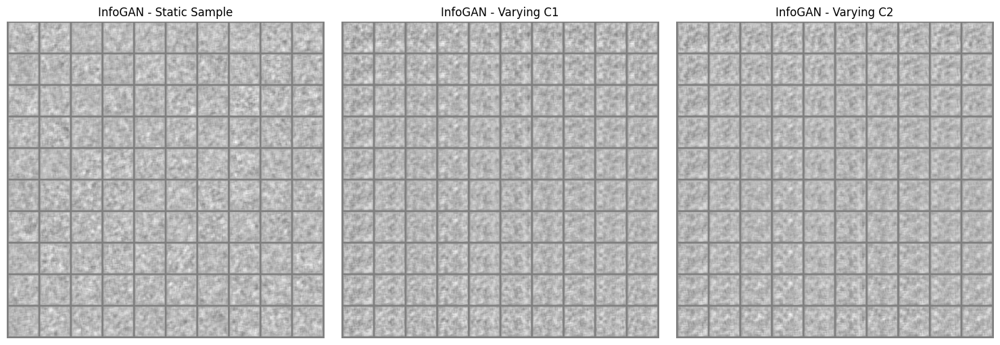

Fast mode: Getting initial metrics...
Fast mode: Calculating initial disentanglement metrics...

Initial Metrics Summary:
categorical_accuracy: 0.0980
continuous_correlation_c1: -0.0252
continuous_correlation_c2: -0.0916
continuous_correlation_avg: -0.0584
factor_independence: 0.9884

Starting training...


Epoch 1/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 1/30 completed in 41.6s | G_loss: 0.4582 | D_loss: 0.2052 | Info_loss: 1.5915 | Cat_Acc: 0.9960 | Cont_Corr: 0.9091
Checkpoint saved: checkpoints/InfoGAN/checkpoint_epoch_1.pth


Epoch 2/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 2/30 completed in 43.5s | G_loss: 0.3580 | D_loss: 0.2149 | Info_loss: 1.4891 | Cat_Acc: 0.9980 | Cont_Corr: 0.8926


Epoch 3/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 3/30 completed in 41.6s | G_loss: 0.3459 | D_loss: 0.2170 | Info_loss: 1.4895 | Cat_Acc: 0.9920 | Cont_Corr: 0.8880


Epoch 4/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 4/30 completed in 41.6s | G_loss: 0.3387 | D_loss: 0.2178 | Info_loss: 1.4908 | Cat_Acc: 0.9960 | Cont_Corr: 0.8652


Epoch 5/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 5/30 completed in 40.5s | G_loss: 0.3353 | D_loss: 0.2194 | Info_loss: 1.4890 | Cat_Acc: 1.0000 | Cont_Corr: 0.8738


Epoch 6/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 6/30 completed in 41.1s | G_loss: 0.3338 | D_loss: 0.2180 | Info_loss: 1.4867 | Cat_Acc: 0.9960 | Cont_Corr: 0.8679
Checkpoint saved: checkpoints/InfoGAN/checkpoint_epoch_6.pth


Epoch 7/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 7/30 completed in 41.7s | G_loss: 0.3387 | D_loss: 0.2145 | Info_loss: 1.4851 | Cat_Acc: 0.9980 | Cont_Corr: 0.9087


Epoch 8/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 8/30 completed in 42.0s | G_loss: 0.3442 | D_loss: 0.2111 | Info_loss: 1.4870 | Cat_Acc: 0.9960 | Cont_Corr: 0.8886


Epoch 9/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 9/30 completed in 41.4s | G_loss: 0.3479 | D_loss: 0.2084 | Info_loss: 1.4876 | Cat_Acc: 0.9960 | Cont_Corr: 0.8924


Epoch 10/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 10/30 completed in 41.5s | G_loss: 0.3476 | D_loss: 0.2088 | Info_loss: 1.4868 | Cat_Acc: 0.9960 | Cont_Corr: 0.8568


Epoch 11/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 11/30 completed in 41.1s | G_loss: 0.3501 | D_loss: 0.2052 | Info_loss: 1.4859 | Cat_Acc: 0.9980 | Cont_Corr: 0.8909
Checkpoint saved: checkpoints/InfoGAN/checkpoint_epoch_11.pth


Epoch 12/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 12/30 completed in 41.6s | G_loss: 0.3557 | D_loss: 0.2054 | Info_loss: 1.4852 | Cat_Acc: 0.9940 | Cont_Corr: 0.8910


Epoch 13/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 13/30 completed in 41.6s | G_loss: 0.3617 | D_loss: 0.2022 | Info_loss: 1.4843 | Cat_Acc: 0.9980 | Cont_Corr: 0.8899


Epoch 14/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 14/30 completed in 41.5s | G_loss: 0.3678 | D_loss: 0.2010 | Info_loss: 1.4845 | Cat_Acc: 0.9960 | Cont_Corr: 0.8871


Epoch 15/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 15/30 completed in 41.4s | G_loss: 0.3713 | D_loss: 0.2011 | Info_loss: 1.4840 | Cat_Acc: 1.0000 | Cont_Corr: 0.8892


Epoch 16/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 16/30 completed in 40.7s | G_loss: 0.3757 | D_loss: 0.2001 | Info_loss: 1.4836 | Cat_Acc: 0.9980 | Cont_Corr: 0.8831
Checkpoint saved: checkpoints/InfoGAN/checkpoint_epoch_16.pth


Epoch 17/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 17/30 completed in 40.9s | G_loss: 0.3753 | D_loss: 0.2027 | Info_loss: 1.4833 | Cat_Acc: 0.9940 | Cont_Corr: 0.8791


Epoch 18/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 18/30 completed in 41.0s | G_loss: 0.3790 | D_loss: 0.2000 | Info_loss: 1.4840 | Cat_Acc: 1.0000 | Cont_Corr: 0.8897


Epoch 19/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 19/30 completed in 41.1s | G_loss: 0.3729 | D_loss: 0.2021 | Info_loss: 1.4836 | Cat_Acc: 0.9960 | Cont_Corr: 0.8805


Epoch 20/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 20/30 completed in 40.9s | G_loss: 0.3645 | D_loss: 0.2008 | Info_loss: 1.4845 | Cat_Acc: 0.9960 | Cont_Corr: 0.8924


Epoch 21/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 21/30 completed in 40.6s | G_loss: 0.3690 | D_loss: 0.2000 | Info_loss: 1.4846 | Cat_Acc: 0.9980 | Cont_Corr: 0.8833
Checkpoint saved: checkpoints/InfoGAN/checkpoint_epoch_21.pth


Epoch 22/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 22/30 completed in 40.5s | G_loss: 0.3746 | D_loss: 0.2022 | Info_loss: 1.4842 | Cat_Acc: 0.9980 | Cont_Corr: 0.8884


Epoch 23/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 23/30 completed in 41.3s | G_loss: 0.3722 | D_loss: 0.2034 | Info_loss: 1.4841 | Cat_Acc: 0.9960 | Cont_Corr: 0.8844


Epoch 24/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 24/30 completed in 41.5s | G_loss: 0.3711 | D_loss: 0.2019 | Info_loss: 1.4833 | Cat_Acc: 0.9980 | Cont_Corr: 0.8962


Epoch 25/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 25/30 completed in 41.2s | G_loss: 0.3777 | D_loss: 0.2007 | Info_loss: 1.4828 | Cat_Acc: 0.9980 | Cont_Corr: 0.8867


Epoch 26/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 26/30 completed in 40.4s | G_loss: 0.3678 | D_loss: 0.2010 | Info_loss: 1.4828 | Cat_Acc: 1.0000 | Cont_Corr: 0.8953
Checkpoint saved: checkpoints/InfoGAN/checkpoint_epoch_26.pth


Epoch 27/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 27/30 completed in 40.5s | G_loss: 0.3817 | D_loss: 0.2021 | Info_loss: 1.4822 | Cat_Acc: 0.9980 | Cont_Corr: 0.8980


Epoch 28/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 28/30 completed in 40.7s | G_loss: 0.3744 | D_loss: 0.2033 | Info_loss: 1.4816 | Cat_Acc: 1.0000 | Cont_Corr: 0.9056


Epoch 29/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 29/30 completed in 40.8s | G_loss: 0.3698 | D_loss: 0.2076 | Info_loss: 1.4813 | Cat_Acc: 0.9980 | Cont_Corr: 0.9002


Epoch 30/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 30/30 completed in 40.8s | G_loss: 0.3711 | D_loss: 0.2020 | Info_loss: 1.4819 | Cat_Acc: 1.0000 | Cont_Corr: 0.8966
Checkpoint saved: checkpoints/InfoGAN/checkpoint_epoch_30.pth

Running final evaluation for InfoGAN...

==================== InfoGAN - Final Model Evaluation ====================
Generating sample images...


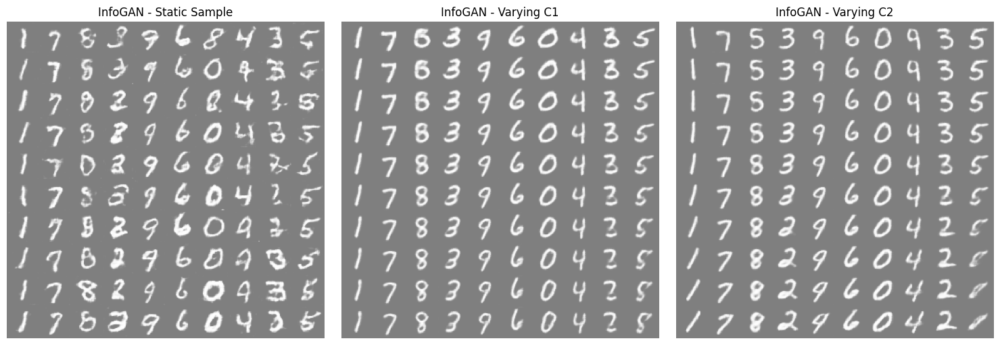

Evaluating basic metrics...
Calculating advanced disentanglement metrics...

Metrics Summary:
categorical_accuracy: 0.9960
continuous_correlation_c1: 0.8923
continuous_correlation_c2: 0.9162
continuous_correlation_avg: 0.9042
factor_independence: 0.3910
traversal_linearity: 0.9015
categorical_mi: 1.0000
continuous_mi_avg: 0.8447
continuous_mi_0: 0.6381
continuous_mi_1: 1.0514
disentanglement_score: 0.1993

InfoGAN Training Summary
Training time: 0h 20m 37s
Final categorical accuracy: 0.9960 (improved by 916.3%)
Final continuous correlation: 0.9042 (improved by 96263.2%)
Final disentanglement score: 0.1993 (improved by 19926.3%)
Final factor independence: 0.6090
Final traversal linearity: 0.9015
Final categorical MI: 1.0000

Starting training for InfoGAN-OR
Orthogonal Regularization: Enabled
Contrastive Regularization: Disabled

==================== InfoGAN-OR - Initial Model Evaluation ====================
Fast mode: Generating initial sample images...


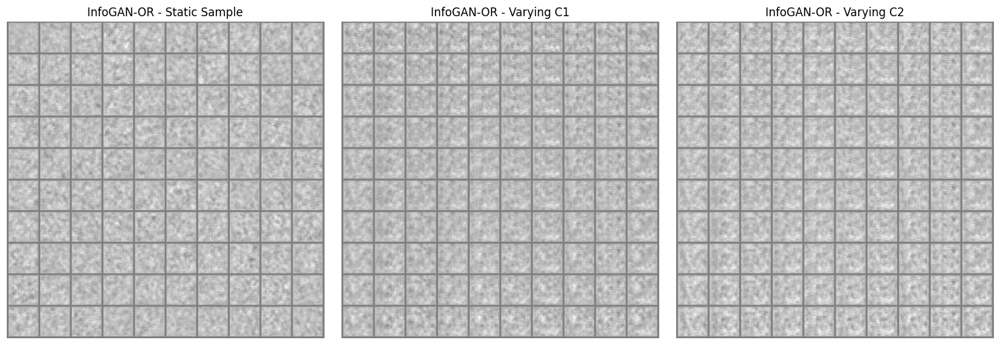

Fast mode: Getting initial metrics...
Fast mode: Calculating initial disentanglement metrics...

Initial Metrics Summary:
categorical_accuracy: 0.1000
continuous_correlation_c1: 0.0407
continuous_correlation_c2: -0.0628
continuous_correlation_avg: -0.0110
factor_independence: 0.9907

Starting training...


Epoch 1/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 1/30 completed in 78.5s | G_loss: 0.3621 | D_loss: 0.7510 | Info_loss: 2.0258 | Ortho_loss: 16.7693 | Cat_Acc: 1.0000 | Cont_Corr: 0.8953
Checkpoint saved: checkpoints/InfoGAN-OR/checkpoint_epoch_1.pth


Epoch 2/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 2/30 completed in 78.7s | G_loss: 0.4143 | D_loss: 0.5288 | Info_loss: 1.5190 | Ortho_loss: 13.9558 | Cat_Acc: 1.0000 | Cont_Corr: 0.9324


Epoch 3/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 3/30 completed in 78.1s | G_loss: 0.4154 | D_loss: 0.5073 | Info_loss: 1.5079 | Ortho_loss: 13.9493 | Cat_Acc: 1.0000 | Cont_Corr: 0.9202


Epoch 4/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 4/30 completed in 77.9s | G_loss: 0.4009 | D_loss: 0.5089 | Info_loss: 1.5034 | Ortho_loss: 13.9487 | Cat_Acc: 0.9980 | Cont_Corr: 0.9320


Epoch 5/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 5/30 completed in 79.4s | G_loss: 0.3932 | D_loss: 0.5032 | Info_loss: 1.5022 | Ortho_loss: 13.9473 | Cat_Acc: 1.0000 | Cont_Corr: 0.9083


Epoch 6/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 6/30 completed in 78.4s | G_loss: 0.3844 | D_loss: 0.5047 | Info_loss: 1.5013 | Ortho_loss: 13.9461 | Cat_Acc: 1.0000 | Cont_Corr: 0.9210
Checkpoint saved: checkpoints/InfoGAN-OR/checkpoint_epoch_6.pth


Epoch 7/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 7/30 completed in 78.7s | G_loss: 0.3808 | D_loss: 0.4994 | Info_loss: 1.5005 | Ortho_loss: 13.9456 | Cat_Acc: 1.0000 | Cont_Corr: 0.9241


Epoch 8/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 8/30 completed in 78.8s | G_loss: 0.3672 | D_loss: 0.5011 | Info_loss: 1.4992 | Ortho_loss: 13.9453 | Cat_Acc: 1.0000 | Cont_Corr: 0.8976


Epoch 9/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 9/30 completed in 78.4s | G_loss: 0.3575 | D_loss: 0.5012 | Info_loss: 1.4987 | Ortho_loss: 13.9448 | Cat_Acc: 1.0000 | Cont_Corr: 0.9231


Epoch 10/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 10/30 completed in 78.1s | G_loss: 0.3553 | D_loss: 0.4965 | Info_loss: 1.4984 | Ortho_loss: 13.9449 | Cat_Acc: 1.0000 | Cont_Corr: 0.9178


Epoch 11/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 11/30 completed in 79.0s | G_loss: 0.3574 | D_loss: 0.4924 | Info_loss: 1.4988 | Ortho_loss: 13.9446 | Cat_Acc: 0.9980 | Cont_Corr: 0.8927
Checkpoint saved: checkpoints/InfoGAN-OR/checkpoint_epoch_11.pth


Epoch 12/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 12/30 completed in 78.9s | G_loss: 0.3451 | D_loss: 0.4929 | Info_loss: 1.4990 | Ortho_loss: 13.9450 | Cat_Acc: 1.0000 | Cont_Corr: 0.9151


Epoch 13/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 13/30 completed in 78.7s | G_loss: 0.3412 | D_loss: 0.4987 | Info_loss: 1.4992 | Ortho_loss: 13.9450 | Cat_Acc: 0.9980 | Cont_Corr: 0.9049


Epoch 14/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 14/30 completed in 78.0s | G_loss: 0.3376 | D_loss: 0.4948 | Info_loss: 1.4995 | Ortho_loss: 13.9450 | Cat_Acc: 1.0000 | Cont_Corr: 0.9118


Epoch 15/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 15/30 completed in 78.0s | G_loss: 0.3318 | D_loss: 0.4935 | Info_loss: 1.5001 | Ortho_loss: 13.9449 | Cat_Acc: 1.0000 | Cont_Corr: 0.9012


Epoch 16/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 16/30 completed in 78.3s | G_loss: 0.3252 | D_loss: 0.4933 | Info_loss: 1.5004 | Ortho_loss: 13.9447 | Cat_Acc: 1.0000 | Cont_Corr: 0.9211
Checkpoint saved: checkpoints/InfoGAN-OR/checkpoint_epoch_16.pth


Epoch 17/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 17/30 completed in 77.8s | G_loss: 0.3202 | D_loss: 0.4965 | Info_loss: 1.4996 | Ortho_loss: 13.9446 | Cat_Acc: 0.9980 | Cont_Corr: 0.9144


Epoch 18/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 18/30 completed in 77.9s | G_loss: 0.3214 | D_loss: 0.4943 | Info_loss: 1.5005 | Ortho_loss: 13.9449 | Cat_Acc: 0.9980 | Cont_Corr: 0.9154


Epoch 19/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 19/30 completed in 78.0s | G_loss: 0.3148 | D_loss: 0.4942 | Info_loss: 1.4997 | Ortho_loss: 13.9447 | Cat_Acc: 1.0000 | Cont_Corr: 0.9150


Epoch 20/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 20/30 completed in 77.6s | G_loss: 0.3136 | D_loss: 0.4977 | Info_loss: 1.4995 | Ortho_loss: 13.9446 | Cat_Acc: 0.9980 | Cont_Corr: 0.9184


Epoch 21/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 21/30 completed in 78.0s | G_loss: 0.3136 | D_loss: 0.4974 | Info_loss: 1.5009 | Ortho_loss: 13.9446 | Cat_Acc: 1.0000 | Cont_Corr: 0.9111
Checkpoint saved: checkpoints/InfoGAN-OR/checkpoint_epoch_21.pth


Epoch 22/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 22/30 completed in 77.7s | G_loss: 0.3156 | D_loss: 0.4995 | Info_loss: 1.5032 | Ortho_loss: 13.9447 | Cat_Acc: 1.0000 | Cont_Corr: 0.9080


Epoch 23/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 23/30 completed in 77.6s | G_loss: 0.3125 | D_loss: 0.4962 | Info_loss: 1.5024 | Ortho_loss: 13.9444 | Cat_Acc: 1.0000 | Cont_Corr: 0.9166


Epoch 24/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 24/30 completed in 78.1s | G_loss: 0.3127 | D_loss: 0.4963 | Info_loss: 1.5017 | Ortho_loss: 13.9446 | Cat_Acc: 1.0000 | Cont_Corr: 0.9244


Epoch 25/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 25/30 completed in 78.5s | G_loss: 0.3030 | D_loss: 0.4950 | Info_loss: 1.5024 | Ortho_loss: 13.9443 | Cat_Acc: 1.0000 | Cont_Corr: 0.9148


Epoch 26/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 26/30 completed in 77.7s | G_loss: 0.3071 | D_loss: 0.4941 | Info_loss: 1.5030 | Ortho_loss: 13.9444 | Cat_Acc: 0.9980 | Cont_Corr: 0.9091
Checkpoint saved: checkpoints/InfoGAN-OR/checkpoint_epoch_26.pth


Epoch 27/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 27/30 completed in 78.1s | G_loss: 0.3076 | D_loss: 0.4963 | Info_loss: 1.5037 | Ortho_loss: 13.9443 | Cat_Acc: 1.0000 | Cont_Corr: 0.9090


Epoch 28/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 28/30 completed in 78.5s | G_loss: 0.3139 | D_loss: 0.4953 | Info_loss: 1.5034 | Ortho_loss: 13.9444 | Cat_Acc: 0.9980 | Cont_Corr: 0.9041


Epoch 29/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 29/30 completed in 77.7s | G_loss: 0.3099 | D_loss: 0.4930 | Info_loss: 1.5032 | Ortho_loss: 13.9444 | Cat_Acc: 1.0000 | Cont_Corr: 0.9047


Epoch 30/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 30/30 completed in 77.9s | G_loss: 0.3071 | D_loss: 0.4950 | Info_loss: 1.5022 | Ortho_loss: 13.9442 | Cat_Acc: 1.0000 | Cont_Corr: 0.9219
Checkpoint saved: checkpoints/InfoGAN-OR/checkpoint_epoch_30.pth

Running final evaluation for InfoGAN-OR...

==================== InfoGAN-OR - Final Model Evaluation ====================
Generating sample images...


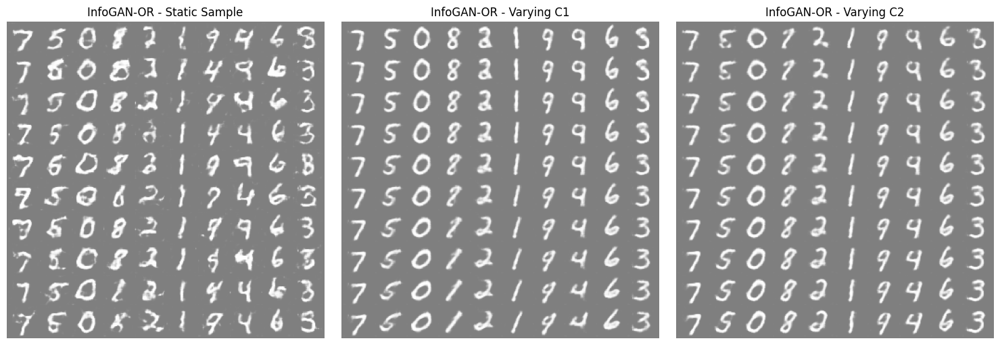

Evaluating basic metrics...
Calculating advanced disentanglement metrics...

Metrics Summary:
categorical_accuracy: 1.0000
continuous_correlation_c1: 0.9280
continuous_correlation_c2: 0.8949
continuous_correlation_avg: 0.9115
factor_independence: 0.3746
traversal_linearity: 0.8771
categorical_mi: 0.9976
continuous_mi_avg: 0.9331
continuous_mi_0: 0.9406
continuous_mi_1: 0.9256
disentanglement_score: 0.1927

InfoGAN-OR Training Summary
Training time: 0h 39m 7s
Final categorical accuracy: 1.0000 (improved by 900.0%)
Final continuous correlation: 0.9115 (improved by 92248.1%)
Final disentanglement score: 0.1927 (improved by 19267.0%)
Final factor independence: 0.6254
Final traversal linearity: 0.8771
Final categorical MI: 0.9976

Starting training for InfoGAN-CR
Orthogonal Regularization: Disabled
Contrastive Regularization: Enabled

==================== InfoGAN-CR - Initial Model Evaluation ====================
Fast mode: Generating initial sample images...


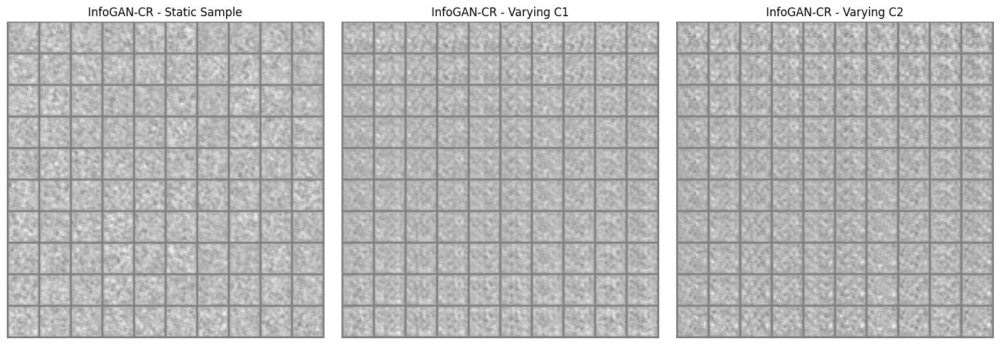

Fast mode: Getting initial metrics...
Fast mode: Calculating initial disentanglement metrics...

Initial Metrics Summary:
categorical_accuracy: 0.0820
continuous_correlation_c1: 0.0367
continuous_correlation_c2: 0.1730
continuous_correlation_avg: 0.1048
factor_independence: 0.9892

Starting training...


Epoch 1/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 1/30 completed in 60.3s | G_loss: 0.4153 | D_loss: 0.2141 | Info_loss: 1.6190 | CR_loss: -0.0411 | Cat_Acc: 1.0000 | Cont_Corr: 0.9142
Checkpoint saved: checkpoints/InfoGAN-CR/checkpoint_epoch_1.pth


Epoch 2/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 2/30 completed in 58.7s | G_loss: 0.3550 | D_loss: 0.2172 | Info_loss: 1.4959 | CR_loss: -0.0527 | Cat_Acc: 0.9840 | Cont_Corr: 0.9107


Epoch 3/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 3/30 completed in 59.6s | G_loss: 0.3450 | D_loss: 0.2182 | Info_loss: 1.4947 | CR_loss: -0.0595 | Cat_Acc: 1.0000 | Cont_Corr: 0.8968


Epoch 4/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 4/30 completed in 59.9s | G_loss: 0.3377 | D_loss: 0.2196 | Info_loss: 1.4930 | CR_loss: -0.0637 | Cat_Acc: 0.9900 | Cont_Corr: 0.8731


Epoch 5/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 5/30 completed in 59.6s | G_loss: 0.3317 | D_loss: 0.2226 | Info_loss: 1.4908 | CR_loss: -0.0682 | Cat_Acc: 0.9980 | Cont_Corr: 0.8651


Epoch 6/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 6/30 completed in 60.0s | G_loss: 0.3332 | D_loss: 0.2192 | Info_loss: 1.4907 | CR_loss: -0.0726 | Cat_Acc: 0.9900 | Cont_Corr: 0.8546
Checkpoint saved: checkpoints/InfoGAN-CR/checkpoint_epoch_6.pth


Epoch 7/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 7/30 completed in 59.4s | G_loss: 0.3358 | D_loss: 0.2161 | Info_loss: 1.4922 | CR_loss: -0.0757 | Cat_Acc: 0.9960 | Cont_Corr: 0.8558


Epoch 8/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 8/30 completed in 60.0s | G_loss: 0.3381 | D_loss: 0.2147 | Info_loss: 1.4918 | CR_loss: -0.0789 | Cat_Acc: 0.9900 | Cont_Corr: 0.8684


Epoch 9/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 9/30 completed in 60.1s | G_loss: 0.3390 | D_loss: 0.2142 | Info_loss: 1.4928 | CR_loss: -0.0815 | Cat_Acc: 0.9840 | Cont_Corr: 0.8716


Epoch 10/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 10/30 completed in 60.2s | G_loss: 0.3390 | D_loss: 0.2150 | Info_loss: 1.4926 | CR_loss: -0.0839 | Cat_Acc: 0.9980 | Cont_Corr: 0.8787


Epoch 11/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 11/30 completed in 59.8s | G_loss: 0.3419 | D_loss: 0.2129 | Info_loss: 1.4930 | CR_loss: -0.0866 | Cat_Acc: 0.9960 | Cont_Corr: 0.8928
Checkpoint saved: checkpoints/InfoGAN-CR/checkpoint_epoch_11.pth


Epoch 12/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 12/30 completed in 59.1s | G_loss: 0.3441 | D_loss: 0.2144 | Info_loss: 1.4911 | CR_loss: -0.0892 | Cat_Acc: 0.9960 | Cont_Corr: 0.9034


Epoch 13/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 13/30 completed in 59.8s | G_loss: 0.3410 | D_loss: 0.2151 | Info_loss: 1.4897 | CR_loss: -0.0924 | Cat_Acc: 0.9960 | Cont_Corr: 0.9000


Epoch 14/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 14/30 completed in 59.0s | G_loss: 0.3440 | D_loss: 0.2148 | Info_loss: 1.4891 | CR_loss: -0.0950 | Cat_Acc: 0.9960 | Cont_Corr: 0.9073


Epoch 15/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 15/30 completed in 59.7s | G_loss: 0.3467 | D_loss: 0.2119 | Info_loss: 1.4888 | CR_loss: -0.0972 | Cat_Acc: 0.9940 | Cont_Corr: 0.9089


Epoch 16/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 16/30 completed in 59.5s | G_loss: 0.3538 | D_loss: 0.2111 | Info_loss: 1.4884 | CR_loss: -0.1008 | Cat_Acc: 0.9960 | Cont_Corr: 0.8857
Checkpoint saved: checkpoints/InfoGAN-CR/checkpoint_epoch_16.pth


Epoch 17/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 17/30 completed in 59.3s | G_loss: 0.3519 | D_loss: 0.2098 | Info_loss: 1.4873 | CR_loss: -0.1031 | Cat_Acc: 0.9960 | Cont_Corr: 0.9092


Epoch 18/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 18/30 completed in 58.6s | G_loss: 0.3596 | D_loss: 0.2078 | Info_loss: 1.4881 | CR_loss: -0.1063 | Cat_Acc: 0.9900 | Cont_Corr: 0.9117


Epoch 19/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 19/30 completed in 60.1s | G_loss: 0.3588 | D_loss: 0.2098 | Info_loss: 1.4871 | CR_loss: -0.1103 | Cat_Acc: 0.9940 | Cont_Corr: 0.9025


Epoch 20/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 20/30 completed in 60.2s | G_loss: 0.3629 | D_loss: 0.2070 | Info_loss: 1.4880 | CR_loss: -0.1129 | Cat_Acc: 1.0000 | Cont_Corr: 0.9135


Epoch 21/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 21/30 completed in 60.2s | G_loss: 0.3572 | D_loss: 0.2116 | Info_loss: 1.4863 | CR_loss: -0.1162 | Cat_Acc: 0.9940 | Cont_Corr: 0.9068
Checkpoint saved: checkpoints/InfoGAN-CR/checkpoint_epoch_21.pth


Epoch 22/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 22/30 completed in 59.6s | G_loss: 0.3652 | D_loss: 0.2086 | Info_loss: 1.4869 | CR_loss: -0.1189 | Cat_Acc: 0.9980 | Cont_Corr: 0.9075


Epoch 23/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 23/30 completed in 59.5s | G_loss: 0.3613 | D_loss: 0.2125 | Info_loss: 1.4866 | CR_loss: -0.1217 | Cat_Acc: 0.9960 | Cont_Corr: 0.9146


Epoch 24/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 24/30 completed in 59.8s | G_loss: 0.3776 | D_loss: 0.2072 | Info_loss: 1.4862 | CR_loss: -0.1246 | Cat_Acc: 1.0000 | Cont_Corr: 0.9028


Epoch 25/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 25/30 completed in 59.8s | G_loss: 0.3679 | D_loss: 0.2096 | Info_loss: 1.4859 | CR_loss: -0.1280 | Cat_Acc: 0.9960 | Cont_Corr: 0.9068


Epoch 26/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 26/30 completed in 61.6s | G_loss: 0.3692 | D_loss: 0.2145 | Info_loss: 1.4851 | CR_loss: -0.1311 | Cat_Acc: 1.0000 | Cont_Corr: 0.9108
Checkpoint saved: checkpoints/InfoGAN-CR/checkpoint_epoch_26.pth


Epoch 27/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 27/30 completed in 62.2s | G_loss: 0.3694 | D_loss: 0.2122 | Info_loss: 1.4843 | CR_loss: -0.1340 | Cat_Acc: 0.9920 | Cont_Corr: 0.9074


Epoch 28/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 28/30 completed in 60.8s | G_loss: 0.3724 | D_loss: 0.2077 | Info_loss: 1.4855 | CR_loss: -0.1372 | Cat_Acc: 0.9980 | Cont_Corr: 0.9063


Epoch 29/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 29/30 completed in 60.5s | G_loss: 0.3762 | D_loss: 0.2095 | Info_loss: 1.4848 | CR_loss: -0.1400 | Cat_Acc: 0.9980 | Cont_Corr: 0.9034


Epoch 30/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 30/30 completed in 60.4s | G_loss: 0.3778 | D_loss: 0.2116 | Info_loss: 1.4852 | CR_loss: -0.1427 | Cat_Acc: 0.9940 | Cont_Corr: 0.9035
Checkpoint saved: checkpoints/InfoGAN-CR/checkpoint_epoch_30.pth

Running final evaluation for InfoGAN-CR...

==================== InfoGAN-CR - Final Model Evaluation ====================
Generating sample images...


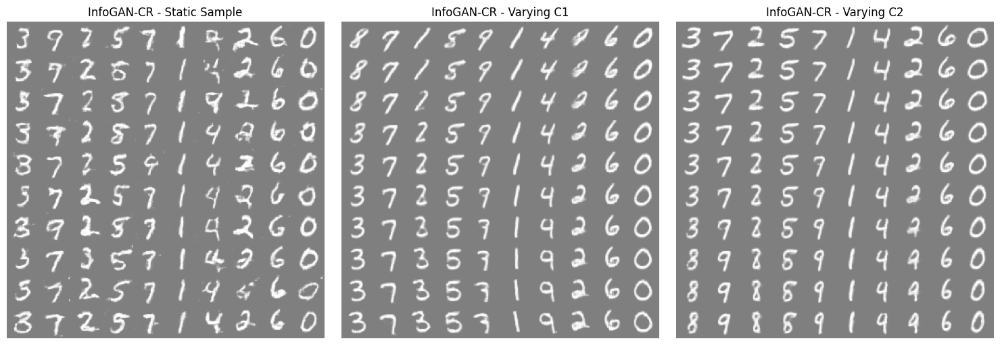

Evaluating basic metrics...
Calculating advanced disentanglement metrics...

Metrics Summary:
categorical_accuracy: 0.9920
continuous_correlation_c1: 0.9252
continuous_correlation_c2: 0.8858
continuous_correlation_avg: 0.9055
factor_independence: 0.3400
traversal_linearity: 0.8572
categorical_mi: 0.9927
continuous_mi_avg: 1.0730
continuous_mi_0: 1.1670
continuous_mi_1: 0.9790
disentanglement_score: 0.1963

InfoGAN-CR Training Summary
Training time: 0h 29m 58s
Final categorical accuracy: 0.9920 (improved by 1109.8%)
Final continuous correlation: 0.9055 (improved by 763.7%)
Final disentanglement score: 0.1963 (improved by 19628.9%)
Final factor independence: 0.6600
Final traversal linearity: 0.8572
Final categorical MI: 0.9927

Starting training for InfoGAN-ORCR
Orthogonal Regularization: Enabled
Contrastive Regularization: Enabled

==================== InfoGAN-ORCR - Initial Model Evaluation ====================
Fast mode: Generating initial sample images...


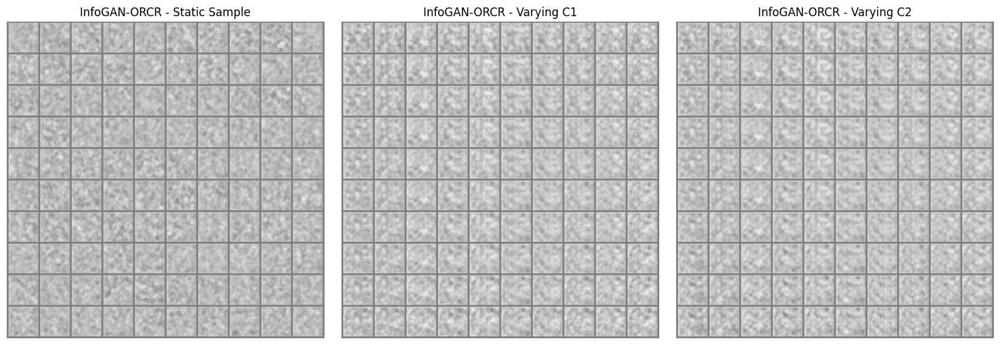

Fast mode: Getting initial metrics...
Fast mode: Calculating initial disentanglement metrics...

Initial Metrics Summary:
categorical_accuracy: 0.1020
continuous_correlation_c1: -0.0724
continuous_correlation_c2: -0.1098
continuous_correlation_avg: -0.0911
factor_independence: 0.9916

Starting training...


Epoch 1/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 1/30 completed in 94.1s | G_loss: 0.3479 | D_loss: 0.7548 | Info_loss: 2.0843 | Ortho_loss: 16.7754 | CR_loss: -0.0137 | Cat_Acc: 1.0000 | Cont_Corr: 0.9135
Checkpoint saved: checkpoints/InfoGAN-ORCR/checkpoint_epoch_1.pth


Epoch 2/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 2/30 completed in 94.4s | G_loss: 0.4145 | D_loss: 0.5395 | Info_loss: 1.5165 | Ortho_loss: 13.9572 | CR_loss: -0.0338 | Cat_Acc: 1.0000 | Cont_Corr: 0.9343


Epoch 3/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 3/30 completed in 94.2s | G_loss: 0.3982 | D_loss: 0.5193 | Info_loss: 1.5043 | Ortho_loss: 13.9482 | CR_loss: -0.0379 | Cat_Acc: 1.0000 | Cont_Corr: 0.9335


Epoch 4/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 4/30 completed in 93.9s | G_loss: 0.3938 | D_loss: 0.5057 | Info_loss: 1.5025 | Ortho_loss: 13.9468 | CR_loss: -0.0407 | Cat_Acc: 1.0000 | Cont_Corr: 0.9333


Epoch 5/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 5/30 completed in 94.1s | G_loss: 0.3834 | D_loss: 0.5039 | Info_loss: 1.4999 | Ortho_loss: 13.9466 | CR_loss: -0.0427 | Cat_Acc: 1.0000 | Cont_Corr: 0.9304


Epoch 6/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 6/30 completed in 94.4s | G_loss: 0.3802 | D_loss: 0.5005 | Info_loss: 1.4990 | Ortho_loss: 13.9464 | CR_loss: -0.0451 | Cat_Acc: 0.9980 | Cont_Corr: 0.9179
Checkpoint saved: checkpoints/InfoGAN-ORCR/checkpoint_epoch_6.pth


Epoch 7/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 7/30 completed in 93.4s | G_loss: 0.3722 | D_loss: 0.4978 | Info_loss: 1.4991 | Ortho_loss: 13.9474 | CR_loss: -0.0469 | Cat_Acc: 1.0000 | Cont_Corr: 0.9220


Epoch 8/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 8/30 completed in 94.2s | G_loss: 0.3631 | D_loss: 0.4924 | Info_loss: 1.4996 | Ortho_loss: 13.9469 | CR_loss: -0.0478 | Cat_Acc: 1.0000 | Cont_Corr: 0.9065


Epoch 9/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 9/30 completed in 93.9s | G_loss: 0.3586 | D_loss: 0.4913 | Info_loss: 1.5021 | Ortho_loss: 13.9474 | CR_loss: -0.0499 | Cat_Acc: 0.9980 | Cont_Corr: 0.9011


Epoch 10/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 10/30 completed in 94.1s | G_loss: 0.3524 | D_loss: 0.4858 | Info_loss: 1.5024 | Ortho_loss: 13.9475 | CR_loss: -0.0512 | Cat_Acc: 1.0000 | Cont_Corr: 0.8869


Epoch 11/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 11/30 completed in 94.4s | G_loss: 0.3496 | D_loss: 0.4839 | Info_loss: 1.5042 | Ortho_loss: 13.9467 | CR_loss: -0.0528 | Cat_Acc: 1.0000 | Cont_Corr: 0.8973
Checkpoint saved: checkpoints/InfoGAN-ORCR/checkpoint_epoch_11.pth


Epoch 12/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 12/30 completed in 94.2s | G_loss: 0.3502 | D_loss: 0.4854 | Info_loss: 1.5048 | Ortho_loss: 13.9466 | CR_loss: -0.0542 | Cat_Acc: 1.0000 | Cont_Corr: 0.8955


Epoch 13/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 13/30 completed in 94.3s | G_loss: 0.3393 | D_loss: 0.4824 | Info_loss: 1.5043 | Ortho_loss: 13.9464 | CR_loss: -0.0559 | Cat_Acc: 1.0000 | Cont_Corr: 0.8886


Epoch 14/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 14/30 completed in 94.5s | G_loss: 0.3384 | D_loss: 0.4843 | Info_loss: 1.5053 | Ortho_loss: 13.9464 | CR_loss: -0.0572 | Cat_Acc: 1.0000 | Cont_Corr: 0.8980


Epoch 15/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 15/30 completed in 94.3s | G_loss: 0.3408 | D_loss: 0.4813 | Info_loss: 1.5058 | Ortho_loss: 13.9459 | CR_loss: -0.0590 | Cat_Acc: 1.0000 | Cont_Corr: 0.9020


Epoch 16/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 16/30 completed in 93.2s | G_loss: 0.3345 | D_loss: 0.4830 | Info_loss: 1.5062 | Ortho_loss: 13.9459 | CR_loss: -0.0601 | Cat_Acc: 1.0000 | Cont_Corr: 0.8860
Checkpoint saved: checkpoints/InfoGAN-ORCR/checkpoint_epoch_16.pth


Epoch 17/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 17/30 completed in 93.7s | G_loss: 0.3304 | D_loss: 0.4833 | Info_loss: 1.5057 | Ortho_loss: 13.9455 | CR_loss: -0.0611 | Cat_Acc: 1.0000 | Cont_Corr: 0.8777


Epoch 18/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 18/30 completed in 93.5s | G_loss: 0.3255 | D_loss: 0.4824 | Info_loss: 1.5052 | Ortho_loss: 13.9450 | CR_loss: -0.0628 | Cat_Acc: 0.9960 | Cont_Corr: 0.9137


Epoch 19/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 19/30 completed in 94.9s | G_loss: 0.3253 | D_loss: 0.4821 | Info_loss: 1.5064 | Ortho_loss: 13.9449 | CR_loss: -0.0640 | Cat_Acc: 1.0000 | Cont_Corr: 0.9012


Epoch 20/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 20/30 completed in 94.1s | G_loss: 0.3219 | D_loss: 0.4821 | Info_loss: 1.5065 | Ortho_loss: 13.9446 | CR_loss: -0.0650 | Cat_Acc: 1.0000 | Cont_Corr: 0.8966


Epoch 21/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 21/30 completed in 94.2s | G_loss: 0.3118 | D_loss: 0.4847 | Info_loss: 1.5061 | Ortho_loss: 13.9440 | CR_loss: -0.0657 | Cat_Acc: 0.9980 | Cont_Corr: 0.8959
Checkpoint saved: checkpoints/InfoGAN-ORCR/checkpoint_epoch_21.pth


Epoch 22/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 22/30 completed in 93.5s | G_loss: 0.3128 | D_loss: 0.4855 | Info_loss: 1.5066 | Ortho_loss: 13.9438 | CR_loss: -0.0662 | Cat_Acc: 0.9980 | Cont_Corr: 0.8957


Epoch 23/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 23/30 completed in 93.7s | G_loss: 0.3119 | D_loss: 0.4851 | Info_loss: 1.5065 | Ortho_loss: 13.9437 | CR_loss: -0.0667 | Cat_Acc: 1.0000 | Cont_Corr: 0.9059


Epoch 24/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 24/30 completed in 98.6s | G_loss: 0.3120 | D_loss: 0.4812 | Info_loss: 1.5066 | Ortho_loss: 13.9434 | CR_loss: -0.0675 | Cat_Acc: 0.9980 | Cont_Corr: 0.8898


Epoch 25/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 25/30 completed in 101.9s | G_loss: 0.3049 | D_loss: 0.4836 | Info_loss: 1.5062 | Ortho_loss: 13.9429 | CR_loss: -0.0694 | Cat_Acc: 1.0000 | Cont_Corr: 0.9071


Epoch 26/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 26/30 completed in 96.3s | G_loss: 0.3053 | D_loss: 0.4886 | Info_loss: 1.5075 | Ortho_loss: 13.9432 | CR_loss: -0.0700 | Cat_Acc: 0.9980 | Cont_Corr: 0.9102
Checkpoint saved: checkpoints/InfoGAN-ORCR/checkpoint_epoch_26.pth


Epoch 27/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 27/30 completed in 94.1s | G_loss: 0.3099 | D_loss: 0.4858 | Info_loss: 1.5079 | Ortho_loss: 13.9435 | CR_loss: -0.0695 | Cat_Acc: 1.0000 | Cont_Corr: 0.8976


Epoch 28/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 28/30 completed in 93.9s | G_loss: 0.3006 | D_loss: 0.4868 | Info_loss: 1.5066 | Ortho_loss: 13.9429 | CR_loss: -0.0707 | Cat_Acc: 1.0000 | Cont_Corr: 0.8987


Epoch 29/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 29/30 completed in 95.5s | G_loss: 0.3025 | D_loss: 0.4865 | Info_loss: 1.5067 | Ortho_loss: 13.9429 | CR_loss: -0.0712 | Cat_Acc: 1.0000 | Cont_Corr: 0.8942


Epoch 30/30:   0%|          | 0/938 [00:00<?, ?it/s]

Epoch 30/30 completed in 97.8s | G_loss: 0.3090 | D_loss: 0.4863 | Info_loss: 1.5071 | Ortho_loss: 13.9432 | CR_loss: -0.0720 | Cat_Acc: 1.0000 | Cont_Corr: 0.9108
Checkpoint saved: checkpoints/InfoGAN-ORCR/checkpoint_epoch_30.pth

Running final evaluation for InfoGAN-ORCR...

==================== InfoGAN-ORCR - Final Model Evaluation ====================
Generating sample images...


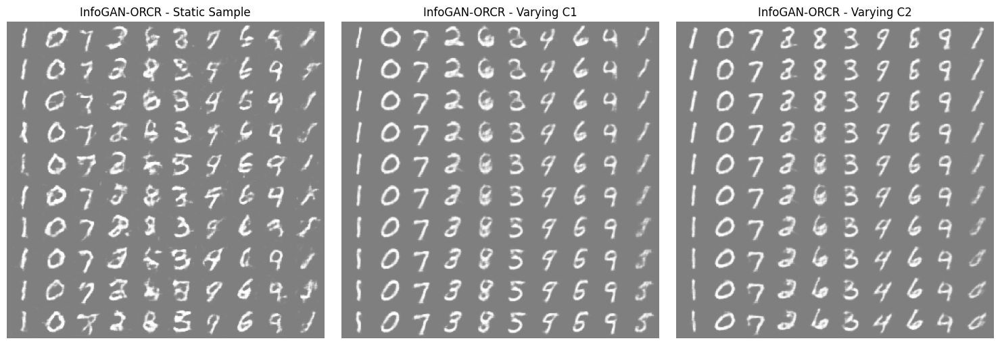

Evaluating basic metrics...
Calculating advanced disentanglement metrics...

Metrics Summary:
categorical_accuracy: 1.0000
continuous_correlation_c1: 0.9127
continuous_correlation_c2: 0.9134
continuous_correlation_avg: 0.9131
factor_independence: 0.4068
traversal_linearity: 0.8520
categorical_mi: 1.0000
continuous_mi_avg: 1.0051
continuous_mi_0: 1.0761
continuous_mi_1: 0.9341
disentanglement_score: 0.2005

InfoGAN-ORCR Training Summary
Training time: 0h 47m 22s
Final categorical accuracy: 1.0000 (improved by 880.4%)
Final continuous correlation: 0.9131 (improved by 100416.6%)
Final disentanglement score: 0.2005 (improved by 20052.8%)
Final factor independence: 0.5932
Final traversal linearity: 0.8520
Final categorical MI: 1.0000

Comparative Analysis of InfoGAN Variants


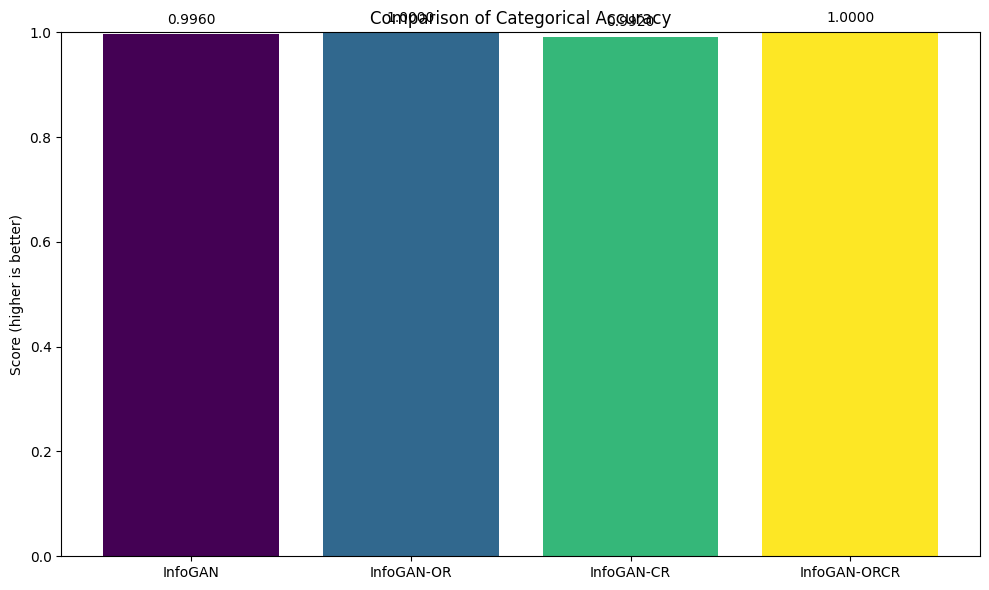

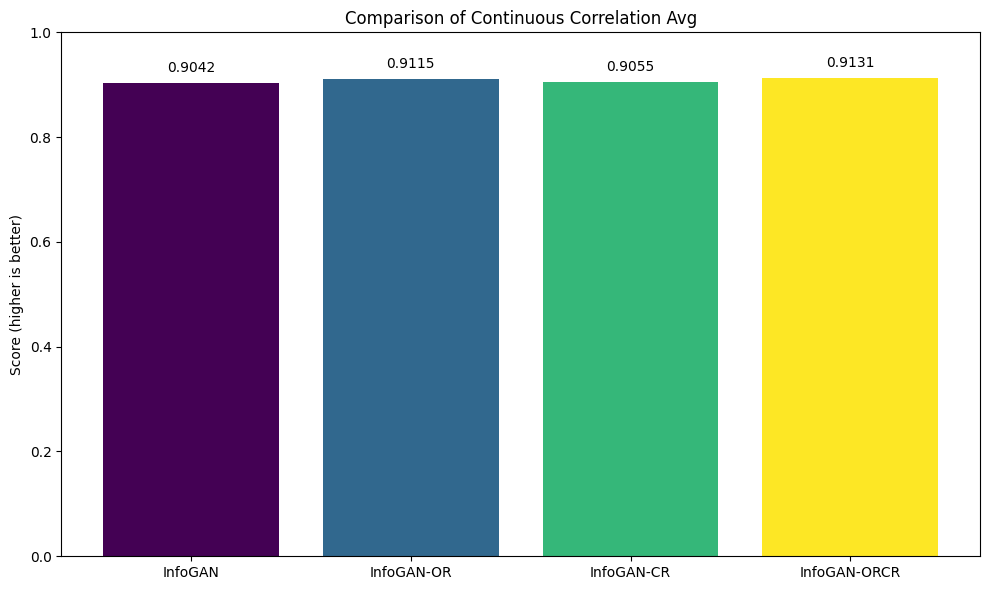

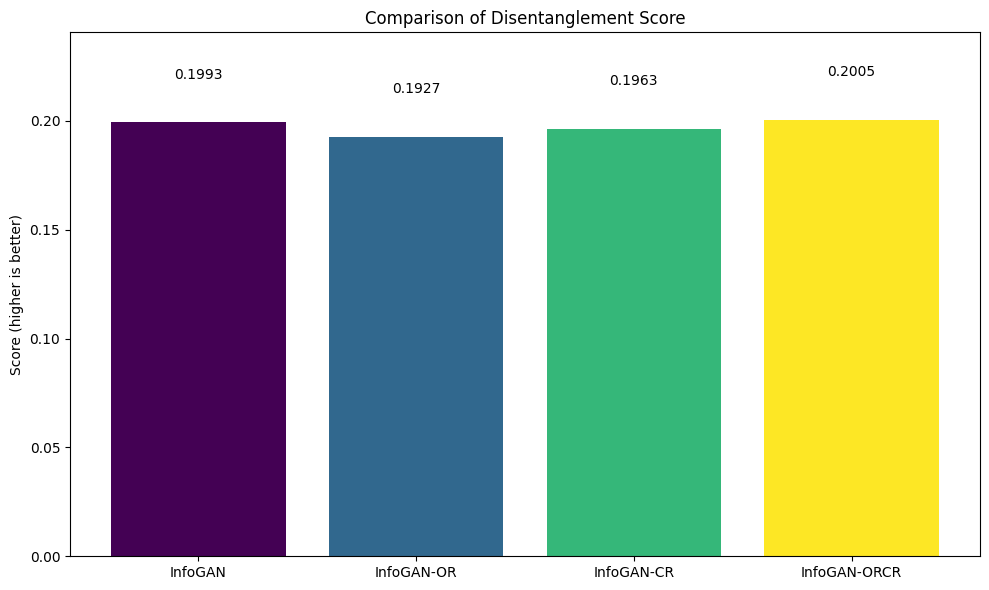

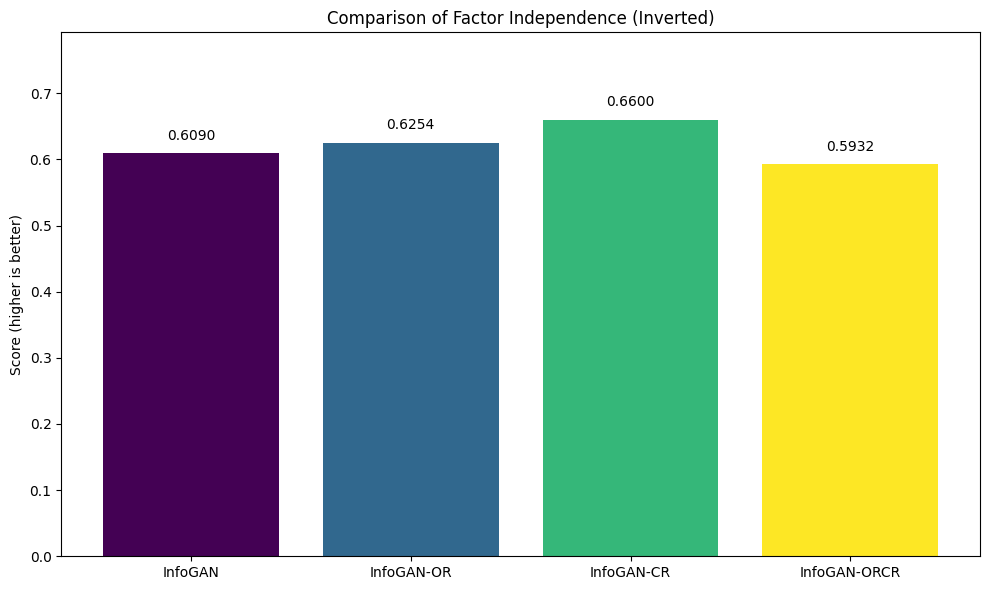

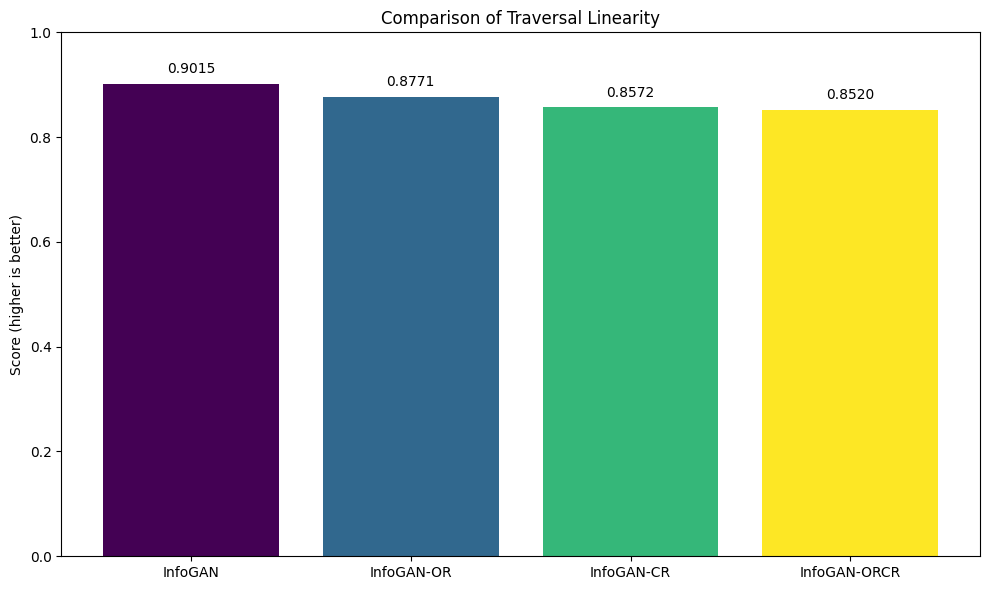

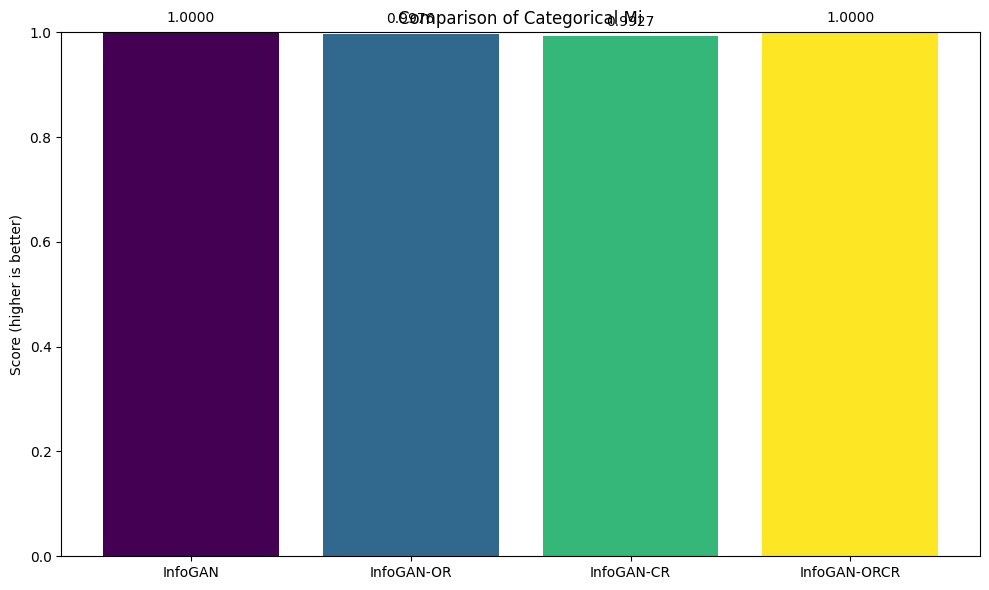

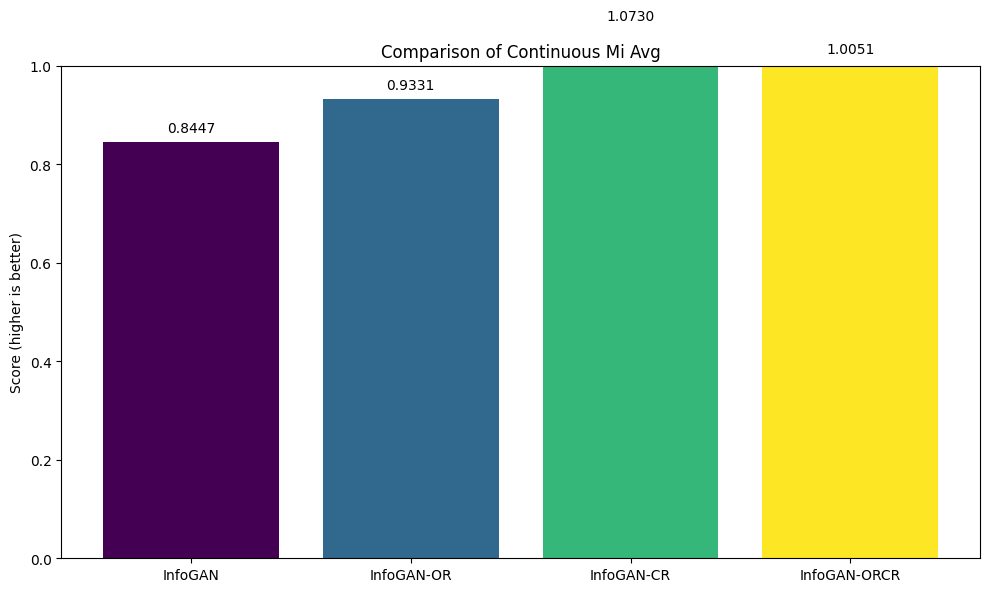

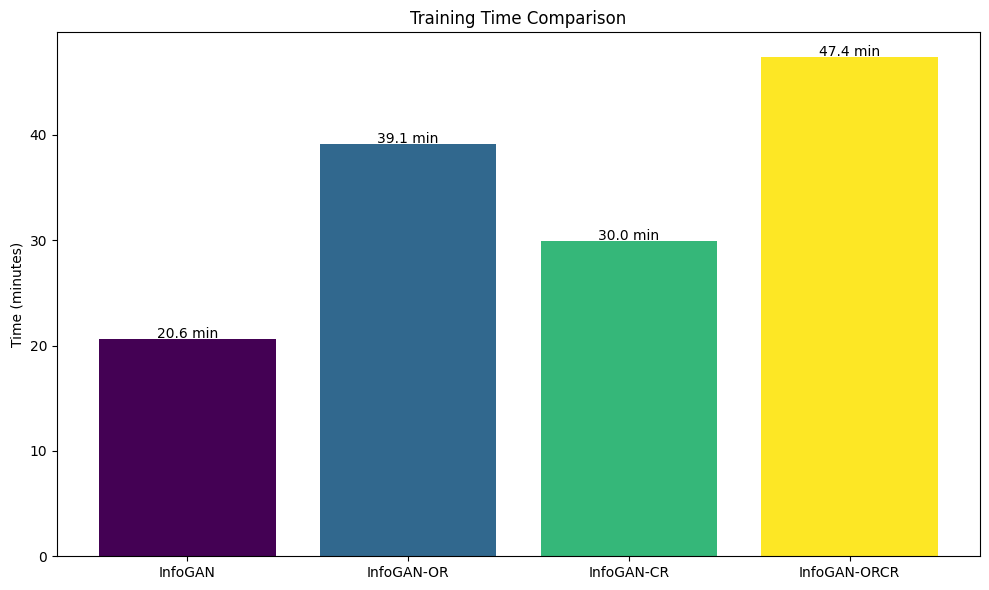

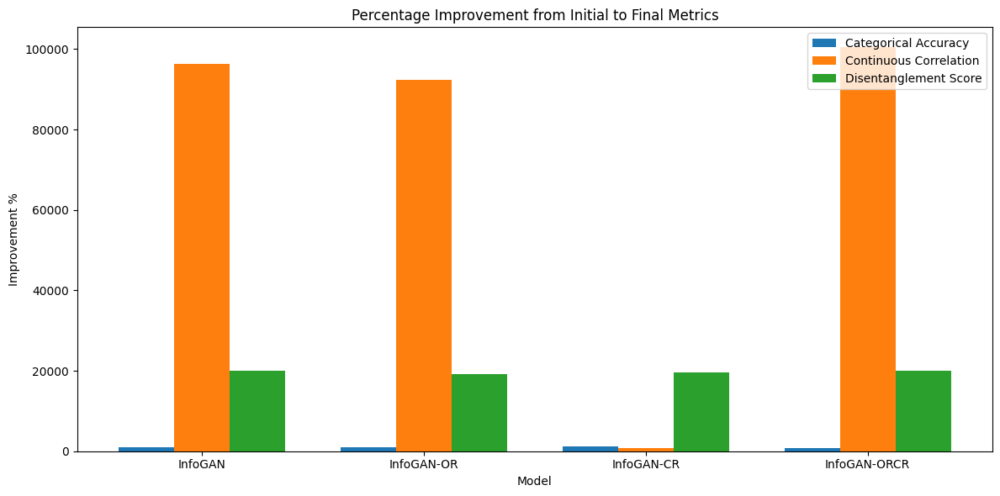

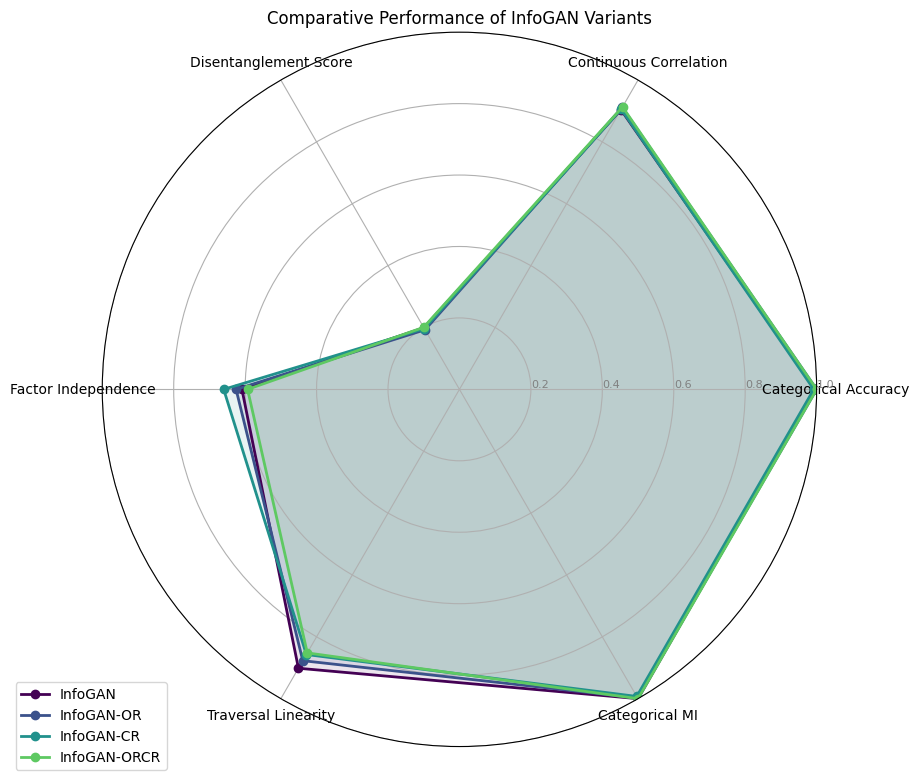


Comprehensive Comparison of All Metrics:

             categorical_accuracy continuous_correlation_avg  \
InfoGAN                    0.9960                     0.9042   
InfoGAN-OR                 1.0000                     0.9115   
InfoGAN-CR                 0.9920                     0.9055   
InfoGAN-ORCR               1.0000                     0.9131   

             disentanglement_score factor_independence traversal_linearity  \
InfoGAN                     0.1993              0.3910              0.9015   
InfoGAN-OR                  0.1927              0.3746              0.8771   
InfoGAN-CR                  0.1963              0.3400              0.8572   
InfoGAN-ORCR                0.2005              0.4068              0.8520   

             categorical_mi continuous_mi_avg training_time_min  
InfoGAN              1.0000            0.8447             20.62  
InfoGAN-OR           0.9976            0.9331             39.12  
InfoGAN-CR           0.9927            1.0730  

<ipython-input-21-74f3148e6ea9>:157: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_df = formatted_df.applymap(lambda x: f"{x:.4f}")


,categorical_accuracy,continuous_correlation_avg,disentanglement_score,factor_independence,traversal_linearity,categorical_mi,continuous_mi_avg,training_time_min
InfoGAN,0.9960,0.9042,0.1993,0.3910,0.9015,1.0000,0.8447,20.62
InfoGAN-OR,1.0000,0.9115,0.1927,0.3746,0.8771,0.9976,0.9331,39.12
InfoGAN-CR,0.9920,0.9055,0.1963,0.3400,0.8572,0.9927,1.0730,29.97
InfoGAN-ORCR,1.0000,0.9131,0.2005,0.4068,0.8520,1.0000,1.0051,47.37



Explanation of Metrics
Categorical Accuracy: Measures how well the model can recover the discrete latent code (digit identity) from generated images. Higher is better.
Continuous Correlation Avg: Average Pearson correlation between input continuous codes (style factors) and predicted codes from generated images. Higher is better.
Disentanglement Score: Measures how well each latent dimension exclusively controls one feature in the generated images. Higher values indicate better separation of factors.
Factor Independence: Measures cross-talk between different latent factors. Lower values indicate less interference between factors. Often visualized as (1 - factor_independence) so higher values are better.
Traversal Linearity: Measures the consistency of changes when moving through latent space. Higher values indicate smoother transitions between states.
Categorical Mi: Mutual information between input categorical codes and their predictions from generated images. Higher values indicate 

Metric,Explanation
categorical_accuracy,Measures how well the model can recover the discrete latent code (digit identity) from generated images. Higher is better.
continuous_correlation_avg,Average Pearson correlation between input continuous codes (style factors) and predicted codes from generated images. Higher is better.
disentanglement_score,Measures how well each latent dimension exclusively controls one feature in the generated images. Higher values indicate better separation of factors.
factor_independence,Measures cross-talk between different latent factors. Lower values indicate less interference between factors. Often visualized as (1 - factor_independence) so higher values are better.
traversal_linearity,Measures the consistency of changes when moving through latent space. Higher values indicate smoother transitions between states.
categorical_mi,Mutual information between input categorical codes and their predictions from generated images. Higher values indicate better preservation of categorical information.
continuous_mi_avg,Average mutual information between input continuous codes and their predictions. Higher values indicate better preservation of continuous style information.



Model Types and Their Regularization Techniques
InfoGAN: The standard InfoGAN as described in the original paper, which maximizes mutual information between latent codes and generated images.
InfoGAN-OR: InfoGAN with Orthogonal Regularization, which encourages orthogonality between the weight vectors of the network, leading to more independent factors.
InfoGAN-CR: InfoGAN with Contrastive Regularization, which ensures consistency in latent space by comparing pairs of generated samples with specific latent code changes.
InfoGAN-ORCR: InfoGAN with both Orthogonal and Contrastive Regularization combined, attempting to get the benefits of both techniques.


Model,Description
InfoGAN,"The standard InfoGAN as described in the original paper, which maximizes mutual information between latent codes and generated images."
InfoGAN-OR,"InfoGAN with Orthogonal Regularization, which encourages orthogonality between the weight vectors of the network, leading to more independent factors."
InfoGAN-CR,"InfoGAN with Contrastive Regularization, which ensures consistency in latent space by comparing pairs of generated samples with specific latent code changes."
InfoGAN-ORCR,"InfoGAN with both Orthogonal and Contrastive Regularization combined, attempting to get the benefits of both techniques."



Comparison complete. All visualizations and models have been saved.

To view TensorBoard visualizations, run the following in a new cell:
%load_ext tensorboard
%tensorboard --logdir=logs


In [ ]:
if __name__ == "__main__":
    results = main()

## Tensorboard Logs

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=logs

<IPython.core.display.Javascript object>

In [ ]:
!ls

checkpoints  data  drive  images  logs	sample_data


In [ ]:
!cp -r /content/images '/content/drive/MyDrive/Colab Notebooks/'

In [ ]:
!cp -r /content/checkpoints '/content/drive/MyDrive/Colab Notebooks/'

In [ ]:
!cp -r /content/logs '/content/drive/MyDrive/Colab Notebooks/'